Found 127989 potential blobs before filtering
After filtering: 22565 sunflower blobs
After duplicate removal: 1100 sunflowers

σ range used: 2 to 20

Top 5 largest sunflowers:
Rank | Center (x,y) | Radius | Response
---------------------------------------------
   1 | (358.0, 179.0) |   28.3 | 0.6216
   2 | (339.0, 179.0) |   28.3 | 0.5991
   3 | (317.0, 179.0) |   28.3 | 0.5084
   4 | (209.0, 187.0) |   28.3 | 0.4550
   5 | (  1.0, 196.0) |   28.3 | 0.3925


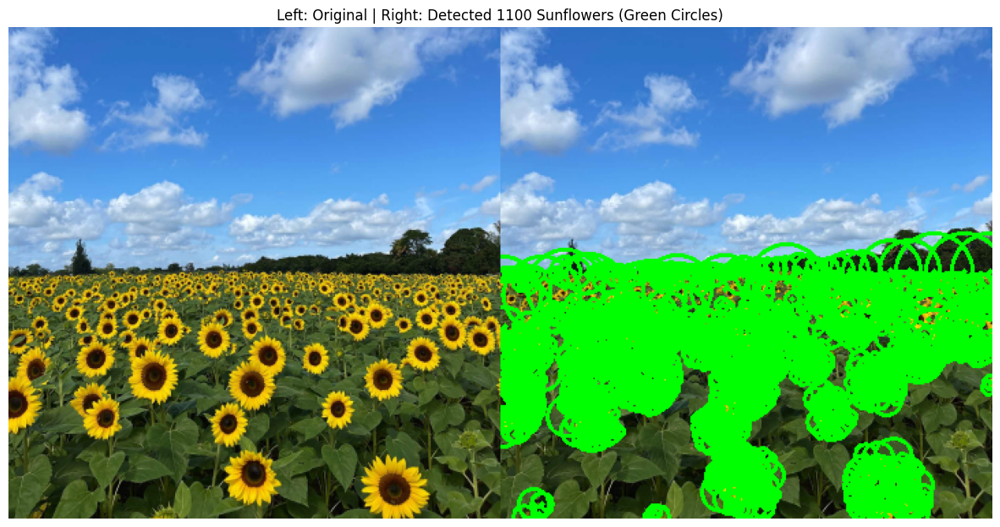


Filtering Statistics:
Total blobs detected: 127989
Removed by sky filter: 8234
Removed by size filter: 16401
Removed by contrast filter: 2366
Removed by color filter: 94288
Final sunflowers: 1100


In [4]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load the image
im = cv.imread('the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)
gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)
gray = gray.astype(np.float32) / 255.0

# Define scale space parameters
sigma_start = 2
sigma_end = 20
num_scales = 10
sigma_values = np.linspace(sigma_start, sigma_end, num_scales)

# Create scale-space (LoG responses)
h, w = gray.shape
log_response = np.zeros((h, w, num_scales), dtype=np.float32)

for i, sigma in enumerate(sigma_values):
    # Apply Gaussian Blur
    ksize = int(6 * sigma + 1)
    blur = cv.GaussianBlur(gray, (ksize, ksize), sigma)
    
    # Laplacian of Gaussian approximation
    log = cv.Laplacian(blur, cv.CV_32F, ksize=3)
    
    # Normalize scale (multiply by sigma^2)
    log_response[:, :, i] = (sigma ** 2) * np.abs(log)

# Find scale-space maxima
max_resp = np.max(log_response, axis=2)
threshold = 0.03  # Tune based on image contrast

blobs = []
for y in range(1, h - 1):
    for x in range(1, w - 1):
        val = max_resp[y, x]
        if val > threshold:
            scale_idx = np.argmax(log_response[y, x, :])
            sigma = sigma_values[scale_idx]
            blobs.append((x, y, sigma, val))  # Store response value too

# FILTERING STRATEGY FOR SUNFLOWERS ONLY
print(f"Found {len(blobs)} potential blobs before filtering")

# Convert to HSV for color-based filtering
hsv = cv.cvtColor(im, cv.COLOR_BGR2HSV)

# Strategy 1: Remove blobs in sky (bright regions)
def is_in_sky_region(y_coord, gray_img, threshold=0.7):
    """Check if blob is in bright sky region"""
    return gray_img[y_coord, :].mean() > threshold

# Strategy 2: Color-based filtering for yellow/brown sunflowers
def has_sunflower_color(x, y, hsv_img, radius=5):
    """Check if region has sunflower-like colors (yellow/brown)"""
    y_min = max(0, y - radius)
    y_max = min(hsv_img.shape[0], y + radius)
    x_min = max(0, x - radius)
    x_max = min(hsv_img.shape[1], x + radius)
    
    region = hsv_img[y_min:y_max, x_min:x_max]
    
    if region.size == 0:
        return False
    
    # Yellow colors in HSV: H~20-30, S~100-255, V~100-255
    yellow_mask = cv.inRange(region, (20, 100, 100), (30, 255, 255))
    
    # Brown colors in HSV: H~10-20, S~50-150, V~50-150  
    brown_mask = cv.inRange(region, (10, 50, 50), (20, 150, 150))
    
    yellow_pixels = np.sum(yellow_mask > 0)
    brown_pixels = np.sum(brown_mask > 0)
    total_pixels = region.shape[0] * region.shape[1]
    
    # At least 10% of pixels should be sunflower colors
    return (yellow_pixels + brown_pixels) / total_pixels > 0.1

# Strategy 3: Size-based filtering (sunflowers have reasonable size)
def is_reasonable_sunflower_size(sigma, min_radius=5, max_radius=50):
    """Filter by expected sunflower size"""
    radius = np.sqrt(2) * sigma
    return min_radius <= radius <= max_radius

# Strategy 4: Local contrast check (sunflowers have good contrast)
def has_good_contrast(x, y, gray_img, sigma, min_contrast=0.1):
    """Check if blob has sufficient local contrast"""
    radius = int(np.sqrt(2) * sigma)
    y_min = max(0, y - radius)
    y_max = min(gray_img.shape[0], y + radius)
    x_min = max(0, x - radius)
    x_max = min(gray_img.shape[1], x + radius)
    
    region = gray_img[y_min:y_max, x_min:x_max]
    
    if region.size == 0:
        return False
    
    local_contrast = region.max() - region.min()
    return local_contrast > min_contrast

# Apply all filters
sunflower_blobs = []
for (x, y, sigma, response) in blobs:
    # Skip if in sky region
    if is_in_sky_region(y, gray):
        continue
        
    # Skip if wrong size
    if not is_reasonable_sunflower_size(sigma):
        continue
        
    # Skip if poor contrast
    if not has_good_contrast(x, y, gray, sigma):
        continue
        
    # Check for sunflower colors (most important filter)
    if not has_sunflower_color(int(x), int(y), hsv):
        continue
        
    sunflower_blobs.append((x, y, sigma, response))

print(f"After filtering: {len(sunflower_blobs)} sunflower blobs")

# Remove nearby duplicates (improved version)
final_sunflowers = []
for b in sorted(sunflower_blobs, key=lambda x: x[3], reverse=True):  # Sort by response
    x, y, sigma, response = b
    radius = np.sqrt(2) * sigma
    
    # Check distance to existing sunflowers
    too_close = False
    for existing in final_sunflowers:
        ex, ey, esigma, eresponse = existing
        existing_radius = np.sqrt(2) * esigma
        distance = np.sqrt((x - ex)**2 + (y - ey)**2)
        
        # If centers are closer than the average radius, skip
        if distance < (radius + existing_radius) * 0.3:
            too_close = True
            break
    
    if not too_close:
        final_sunflowers.append(b)

print(f"After duplicate removal: {len(final_sunflowers)} sunflowers")

# Draw only sunflower circles on the image
output = im.copy()
for (x, y, sigma, response) in final_sunflowers:
    r = int(np.sqrt(2) * sigma)
    cv.circle(output, (int(x), int(y)), r, (0, 255, 0), 2)  # Green for sunflowers
    cv.circle(output, (int(x), int(y)), 2, (0, 255, 0), -1)  # Center dot

# Sort and report largest sunflowers
final_sunflowers.sort(key=lambda b: b[2], reverse=True)  # Sort by size
largest_sunflowers = final_sunflowers[:5]

print("\nσ range used:", sigma_start, "to", sigma_end)
print(f"\nTop 5 largest sunflowers:")
print("Rank | Center (x,y) | Radius | Response")
print("-" * 45)
for i, (x, y, sigma, response) in enumerate(largest_sunflowers):
    radius = np.sqrt(2) * sigma
    print(f"{i+1:4d} | ({x:5.1f}, {y:5.1f}) | {radius:6.1f} | {response:.4f}")

# Create comparison image showing before/after filtering
comparison = np.hstack([im, output])

# Display results
plt.figure(figsize=(15, 8))
plt.imshow(cv.cvtColor(comparison, cv.COLOR_BGR2RGB))
plt.title(f"Left: Original | Right: Detected {len(final_sunflowers)} Sunflowers (Green Circles)")
plt.axis("off")
plt.show()

# Additional: Show which filters removed what
if len(blobs) > 0:
    print(f"\nFiltering Statistics:")
    print(f"Total blobs detected: {len(blobs)}")
    print(f"Removed by sky filter: {sum(1 for b in blobs if is_in_sky_region(b[1], gray))}")
    print(f"Removed by size filter: {sum(1 for b in blobs if not is_reasonable_sunflower_size(b[2]))}")
    print(f"Removed by contrast filter: {sum(1 for b in blobs if not has_good_contrast(b[0], b[1], gray, b[2]))}")
    print(f"Removed by color filter: {sum(1 for b in blobs if not has_sunflower_color(int(b[0]), int(b[1]), hsv))}")
    print(f"Final sunflowers: {len(final_sunflowers)}")

Adaptive threshold: 0.7255
Found 6416 potential blobs
After NMS: 421 blobs
After clustering: 7 final sunflowers
After size filtering: 4 sunflowers

σ range used: 2 to 20

Top 5 largest sunflowers:
Rank | Center (x,y) | Radius | Response
---------------------------------------------
   1 | (282.0, 338.0) |   11.3 | 1.3321
   2 | (  1.0, 275.0) |   11.3 | 1.3226
   3 | (106.0, 255.0) |    8.5 | 1.4417
   4 | ( 53.0, 174.0) |    8.5 | 1.1998


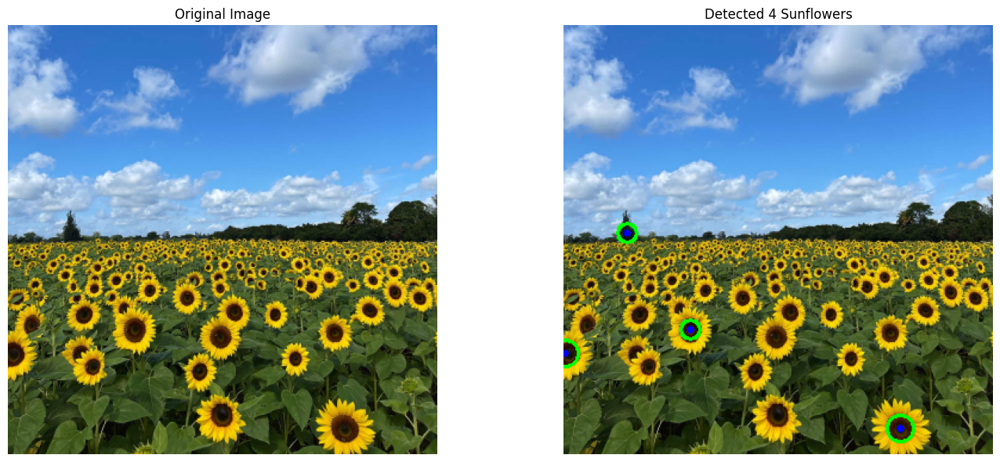


Debug visualization:


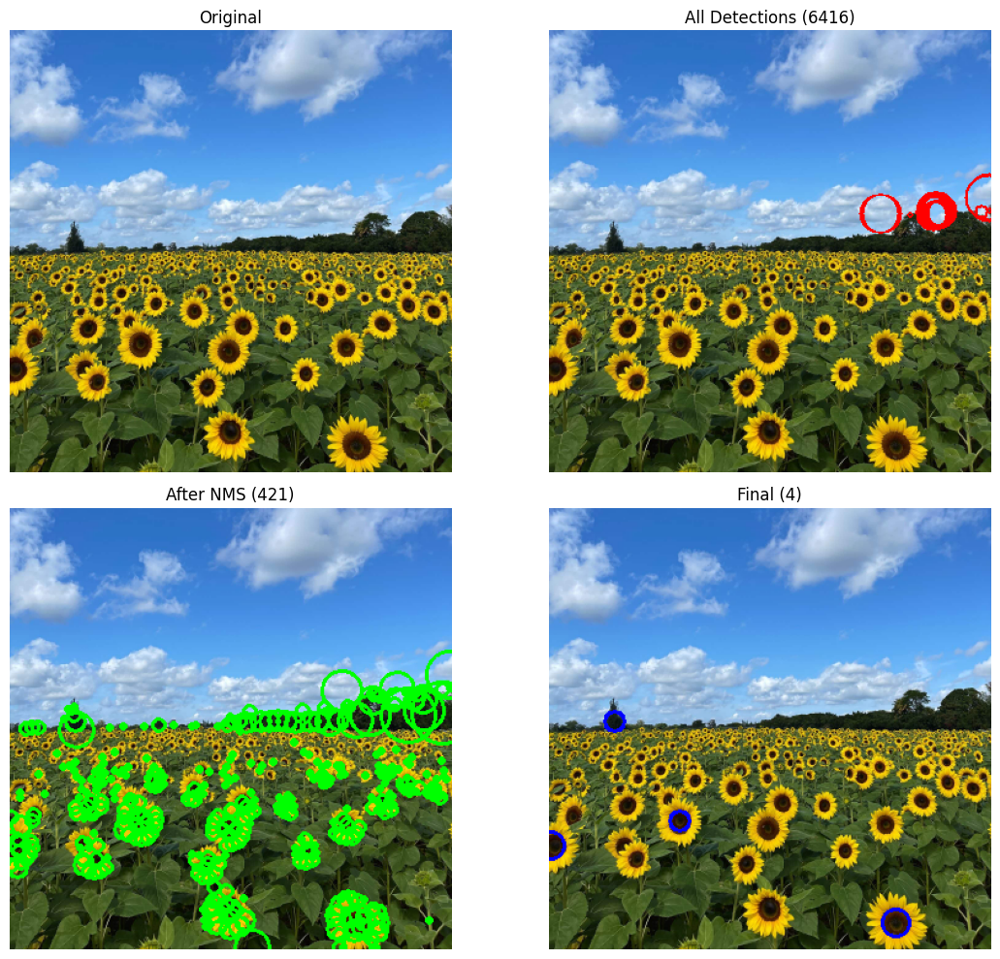

In [8]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Load the image
im = cv.imread('the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)
gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)
gray = gray.astype(np.float32) / 255.0

# Define scale space parameters
sigma_start = 2
sigma_end = 20
num_scales = 10
sigma_values = np.linspace(sigma_start, sigma_end, num_scales)

# Create scale-space (LoG responses)
h, w = gray.shape
log_response = np.zeros((h, w, num_scales), dtype=np.float32)

for i, sigma in enumerate(sigma_values):
    # Apply Gaussian Blur
    ksize = int(6 * sigma + 1)
    blur = cv.GaussianBlur(gray, (ksize, ksize), sigma)
    
    # Laplacian of Gaussian approximation
    log = cv.Laplacian(blur, cv.CV_32F, ksize=3)
    
    # Normalize scale (multiply by sigma^2)
    log_response[:, :, i] = (sigma ** 2) * np.abs(log)

# Find scale-space maxima with better thresholding
max_resp = np.max(log_response, axis=2)
# Use percentile-based threshold instead of fixed value
threshold = np.percentile(max_resp, 95)  # Only top 5% strongest responses
print(f"Adaptive threshold: {threshold:.4f}")

blobs = []
for y in range(1, h - 1):
    for x in range(1, w - 1):
        val = max_resp[y, x]
        if val > threshold:
            scale_idx = np.argmax(log_response[y, x, :])
            sigma = sigma_values[scale_idx]
            blobs.append((x, y, sigma, val))

print(f"Found {len(blobs)} potential blobs")

# IMPROVED NON-MAXIMUM SUPPRESSION
def non_maximum_suppression(blobs, min_distance_ratio=0.5):
    """
    Better NMS that groups nearby detections and keeps the best one per flower
    """
    if not blobs:
        return []
    
    # Sort by response strength (strongest first)
    blobs_sorted = sorted(blobs, key=lambda x: x[3], reverse=True)
    
    suppressed = []
    used_positions = []
    
    for blob in blobs_sorted:
        x, y, sigma, response = blob
        radius = np.sqrt(2) * sigma
        
        # Check if this blob is too close to any already selected blob
        too_close = False
        for used_x, used_y, used_sigma, used_response in used_positions:
            used_radius = np.sqrt(2) * used_sigma
            distance = np.sqrt((x - used_x)**2 + (y - used_y)**2)
            
            # If centers are closer than the average radius, skip
            min_radius = min(radius, used_radius)
            if distance < min_radius * min_distance_ratio:
                too_close = True
                break
        
        if not too_close:
            suppressed.append(blob)
            used_positions.append((x, y, sigma, response))
    
    return suppressed

# Apply improved NMS
filtered_blobs = non_maximum_suppression(blobs, min_distance_ratio=0.8)
print(f"After NMS: {len(filtered_blobs)} blobs")

# CLUSTER-BASED GROUPING (for overlapping detections)
def cluster_blobs(blobs, eps=15, min_samples=1):
    """
    Use DBSCAN to group nearby detections and return cluster centers
    """
    if len(blobs) == 0:
        return []
    
    # Extract coordinates
    coordinates = np.array([[x, y] for x, y, sigma, response in blobs])
    
    # Cluster nearby points
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(coordinates)
    labels = clustering.labels_
    
    clustered_blobs = []
    
    # For each cluster, take the strongest detection
    for cluster_id in set(labels):
        if cluster_id == -1:  # Noise points
            continue
            
        cluster_indices = np.where(labels == cluster_id)[0]
        cluster_blobs = [blobs[i] for i in cluster_indices]
        
        # Take the blob with strongest response
        best_blob = max(cluster_blobs, key=lambda x: x[3])
        clustered_blobs.append(best_blob)
    
    return clustered_blobs

# Apply clustering
final_blobs = cluster_blobs(filtered_blobs, eps=20)
print(f"After clustering: {len(final_blobs)} final sunflowers")

# SIZE-BASED FILTERING (sunflowers should be within reasonable size range)
def filter_by_size(blobs, min_radius=8, max_radius=40):
    filtered = []
    for x, y, sigma, response in blobs:
        radius = np.sqrt(2) * sigma
        if min_radius <= radius <= max_radius:
            filtered.append((x, y, sigma, response))
    return filtered

final_blobs = filter_by_size(final_blobs)
print(f"After size filtering: {len(final_blobs)} sunflowers")

# Draw circles on the image
output = im.copy()
for (x, y, sigma, response) in final_blobs:
    r = int(np.sqrt(2) * sigma)
    cv.circle(output, (int(x), int(y)), r, (0, 255, 0), 2)  # Green circle
    cv.circle(output, (int(x), int(y)), 3, (255, 0, 0), -1)  # Blue center dot

# Sort and report largest circles
final_blobs.sort(key=lambda b: b[2], reverse=True)
largest_circles = final_blobs[:5]

print("\nσ range used:", sigma_start, "to", sigma_end)
print("\nTop 5 largest sunflowers:")
print("Rank | Center (x,y) | Radius | Response")
print("-" * 45)
for i, (x, y, sigma, response) in enumerate(largest_circles):
    radius = np.sqrt(2) * sigma
    print(f"{i+1:4d} | ({x:5.1f}, {y:5.1f}) | {radius:6.1f} | {response:.4f}")

# Display results with comparison
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(output, cv.COLOR_BGR2RGB))
plt.title(f"Detected {len(final_blobs)} Sunflowers")
plt.axis("off")

plt.tight_layout()
plt.show()

# DEBUG: Show different stages
def debug_visualization(original, all_blobs, nms_blobs, final_blobs):
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    
    # Original
    axes[0,0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
    axes[0,0].set_title("Original")
    axes[0,0].axis('off')
    
    # All detections
    img_all = original.copy()
    for x, y, sigma, response in all_blobs[:50]:  # Show first 50 to avoid clutter
        r = int(np.sqrt(2) * sigma)
        cv.circle(img_all, (int(x), int(y)), r, (0, 0, 255), 1)
    axes[0,1].imshow(cv.cvtColor(img_all, cv.COLOR_BGR2RGB))
    axes[0,1].set_title(f"All Detections ({len(all_blobs)})")
    axes[0,1].axis('off')
    
    # After NMS
    img_nms = original.copy()
    for x, y, sigma, response in nms_blobs:
        r = int(np.sqrt(2) * sigma)
        cv.circle(img_nms, (int(x), int(y)), r, (0, 255, 0), 2)
    axes[1,0].imshow(cv.cvtColor(img_nms, cv.COLOR_BGR2RGB))
    axes[1,0].set_title(f"After NMS ({len(nms_blobs)})")
    axes[1,0].axis('off')
    
    # Final
    img_final = original.copy()
    for x, y, sigma, response in final_blobs:
        r = int(np.sqrt(2) * sigma)
        cv.circle(img_final, (int(x), int(y)), r, (255, 0, 0), 2)
    axes[1,1].imshow(cv.cvtColor(img_final, cv.COLOR_BGR2RGB))
    axes[1,1].set_title(f"Final ({len(final_blobs)})")
    axes[1,1].axis('off')
    
    plt.tight_layout()
    plt.show()

print("\nDebug visualization:")
debug_visualization(im, blobs, filtered_blobs, final_blobs)

Image size: (360, 360)
Sigma values: [ 2.          2.68421053  3.36842105  4.05263158  4.73684211  5.42105263
  6.10526316  6.78947368  7.47368421  8.15789474  8.84210526  9.52631579
 10.21052632 10.89473684 11.57894737 12.26315789 12.94736842 13.63157895
 14.31578947 15.        ]
Processing sigma = 2.00
Processing sigma = 2.68
Processing sigma = 3.37
Processing sigma = 4.05
Processing sigma = 4.74
Processing sigma = 5.42
Processing sigma = 6.11
Processing sigma = 6.79
Processing sigma = 7.47
Processing sigma = 8.16
Processing sigma = 8.84
Processing sigma = 9.53
Processing sigma = 10.21
Processing sigma = 10.89
Processing sigma = 11.58
Processing sigma = 12.26
Processing sigma = 12.95
Processing sigma = 13.63
Processing sigma = 14.32
Processing sigma = 15.00
Finding minima for sigma=2.00
Finding minima for sigma=2.68
Finding minima for sigma=3.37
Finding minima for sigma=4.05
Finding minima for sigma=4.74
Finding minima for sigma=5.42
Finding minima for sigma=6.11
Finding minima for s

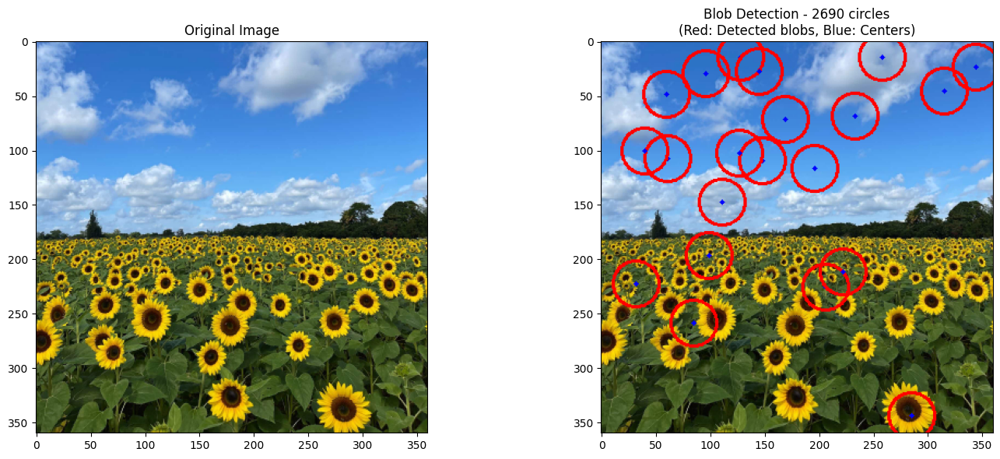


Top 5 largest blobs:
Rank | Center (x,y) | Radius | Sigma | Response
-------------------------------------------------------
   1 | (111.0, 148.0) |  21.21 | 15.00 | -63147.9023
   2 | (258.0,  15.0) |  21.21 | 15.00 | -49015.4102
   3 | (196.0, 117.0) |  21.21 | 15.00 | -43539.3945
   4 | (285.0, 344.0) |  21.21 | 15.00 | -42483.0781
   5 | (148.0, 110.0) |  21.21 | 15.00 | -39799.0703

Visualizing LoG kernels...


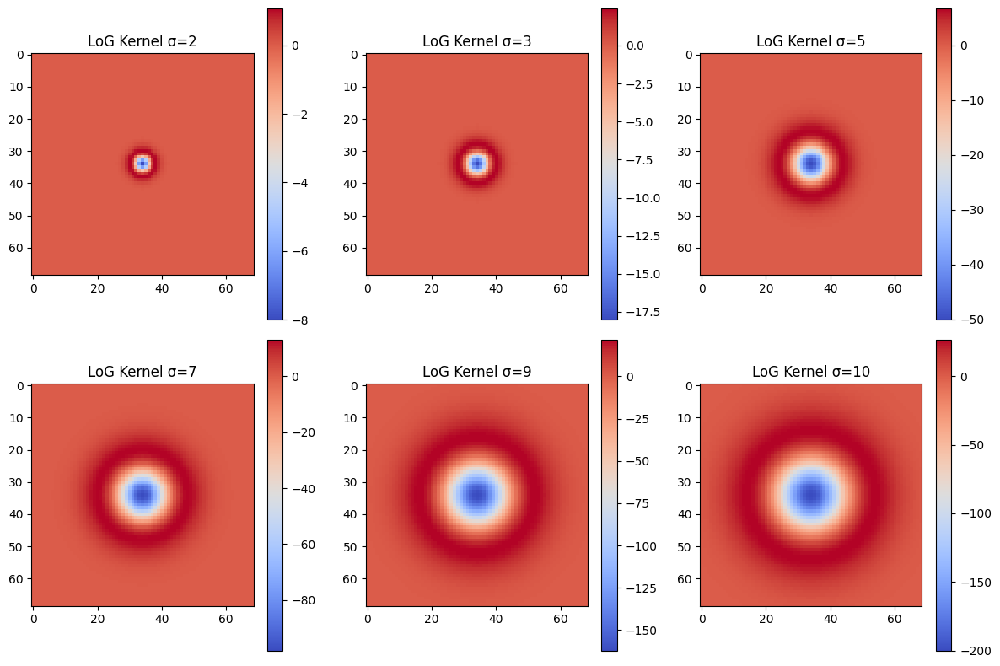

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def create_2d_gaussian_kernel(sigma, size=None):
    """
    Create a 2D Gaussian kernel
    """
    if size is None:
        size = int(6 * sigma) 
        if size % 2 == 0:
            size += 1
        size = max(3, size)
    
    kernel_1d = cv.getGaussianKernel(size, sigma)
    kernel_2d = kernel_1d * kernel_1d.T
    return kernel_2d

def create_laplacian_of_gaussian_kernel(sigma, size=70):
    """
    Create Laplacian of Gaussian kernel and scale by sigma^2
    """
    if size is None:
        size = int(6 * sigma)
        if size % 2 == 0:
            size += 1
        size = max(3, size)
    
    # Create coordinate grid
    k = (size - 1) // 2
    x = np.arange(-k, k + 1)
    y = np.arange(-k, k + 1)
    X, Y = np.meshgrid(x, y)
    
    # Laplacian of Gaussian formula
    r_squared = X**2 + Y**2
    #log_kernel = (-1 / (np.pi * sigma**4)) * (1 - r_squared / (2 * sigma**2)) * np.exp(-r_squared / (2 * sigma**2))
    #log_kernel = (r_squared-2*(sigma**2)) * np.exp(-r_squared / (2 * sigma**2))
    #log_kernel =  (1/(np.sqrt(2*np.pi)*sigma**3))*(r_squared-2*sigma**2) * np.exp(-r_squared / (2 * sigma**2))
    log_kernel =  (r_squared-2*sigma**2) * np.exp(-r_squared / (2 * sigma**2))
    
    # Scale by sigma^2
    #scaled_log_kernel = (sigma ** 2) * log_kernel
    
    return log_kernel

# Load the image
im = cv.imread('the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)
gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)
gray = gray.astype(np.float32) / 255.0

print(f"Image size: {gray.shape}")

# Step 1: Define sigma values
sigma_start = 2
sigma_end = 15
num_scales = 20
sigma_values = np.linspace(sigma_start, sigma_end, num_scales)

print(f"Sigma values: {sigma_values}")

# Step 2 & 3: Create scaled Laplacian of Gaussian kernels and convolve with image
h, w = gray.shape
scale_space = np.zeros((h, w, num_scales), dtype=np.float32)

for i, sigma in enumerate(sigma_values):
    print(f"Processing sigma = {sigma:.2f}")
    
    # Create scaled Laplacian of Gaussian kernel
    log_kernel = create_laplacian_of_gaussian_kernel(sigma)
    
    # Convolve with image
    response = cv.filter2D(gray, cv.CV_32F, log_kernel)
    
    # Store in scale space
    scale_space[:, :, i] = response

# Step 4: Find minima (dark blobs on light background)
# Since we're looking for dark sunflower centers on bright petals, we want minima
blobs = []

# Search for local minima in 3D scale space
for scale_idx in range(num_scales):
    sigma = sigma_values[scale_idx]
    current_response = scale_space[:, :, scale_idx]
    
    # Radius formula: r = sigma * sqrt(2)
    radius = sigma * np.sqrt(2)
    
    print(f"Finding minima for sigma={sigma:.2f}")
    
    # Find local minima in current scale
    for y in range(int(sigma), h-int(sigma)):
        for x in range(int(sigma), w-int(sigma)):
            current_val = current_response[y, x]
            max_val = -10000
            
            # Check if this is a local minimum in 3x3 neighborhood
            is_max = True
            for dy in [-int(sigma), 0, int(sigma)]:
                for dx in [-int(sigma), 0, int(sigma)]:
                    if dy == 0 and dx == 0:
                        continue
                    if current_response[y+dy, x+dx] > current_val:
                        is_max = False
                        break
                    if(current_response[y+dy, x+dx] > max_val):
                        max_val = current_response[y+dy, x+dx]
                if not is_max:
                    break
            #remove sky
            #if(max_val - current_val < 70000):
                #is_max= False
            
            # Check scale-space: compare with adjacent scales
            #if is_minimum and scale_idx > 0:
            #    if current_response[y, x] > scale_space[y, x, scale_idx-1]:
            #        is_minimum = False
            
            #if is_minimum and scale_idx < num_scales-1:
            #    if current_response[y, x] > scale_space[y, x, scale_idx+1]:
            #        is_minimum = False
            
            # If it's a strong enough minimum (very negative)
            if is_max: #and current_val < -0.01:  # Adjust threshold as needed
                blobs.append((x, y, radius, sigma, current_val))

print(f"Found {len(blobs)} blob candidates")

# Remove duplicates - keep the strongest response for each location
final_blobs = []
used_locations = set()

# Sort by response strength (most negative first)
blobs.sort(key=lambda x: x[4])

for blob in blobs:
    x, y, radius, sigma, response = blob
    
    # Check if this location is already used
    location_used = False
    for used_x, used_y, used_r, _, _ in final_blobs:
        distance = np.sqrt((x - used_x)**2 + (y - used_y)**2)
        if distance < min(radius, used_r):
            location_used = True
            break
    
    if not location_used:
        final_blobs.append(blob)
        used_locations.add((x, y))

print(f"After duplicate removal: {len(final_blobs)} blobs")

# Step 5: Draw circles on output image
output = im.copy()

# Sort by radius (largest first) for visualization
final_blobs.sort(key=lambda x: x[2], reverse=True)

# Draw all detected blobs
for i, (x, y, radius, sigma, response) in enumerate(final_blobs):
    # Convert radius to integer for drawing
    r = int(radius)
    
    # Draw circle
    cv.circle(output, (int(x), int(y)), r, (0, 0, 255), 2)
    
    # Draw center point
    cv.circle(output, (int(x), int(y)), 2, (255, 0, 0), -1)
    
    # Only show first 20 to avoid clutter
    if i >= 20:
        break

# Display results
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
plt.title("Original Image")
#plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(output, cv.COLOR_BGR2RGB))
plt.title(f"Blob Detection - {len(final_blobs)} circles\n(Red: Detected blobs, Blue: Centers)")
#plt.axis('off')

plt.tight_layout()
plt.show()

# Report largest circles
if final_blobs:
    print(f"\nTop 5 largest blobs:")
    print("Rank | Center (x,y) | Radius | Sigma | Response")
    print("-" * 55)
    for i, (x, y, radius, sigma, response) in enumerate(final_blobs[:5]):
        print(f"{i+1:4d} | ({x:5.1f}, {y:5.1f}) | {radius:6.2f} | {sigma:5.2f} | {response:.4f}")

# Optional: Visualize LoG kernels
print(f"\nVisualizing LoG kernels...")
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
sample_sigmas = [2, 3, 5, 7, 9, 10]

for i, sigma in enumerate(sample_sigmas):
    if i < 6:
        kernel = create_laplacian_of_gaussian_kernel(sigma)
        ax = axes[i//3, i%3]
        im_plot = ax.imshow(kernel, cmap='coolwarm')
        ax.set_title(f'LoG Kernel σ={sigma}')
        #ax.axis('off')
        plt.colorbar(im_plot, ax=ax)

plt.tight_layout()
plt.show()

Image size: (360, 360)
Radii: [ 6  7  8  9 10 11 12 13 14 15]
Sigma values: [ 4.24264069  4.94974747  5.65685425  6.36396103  7.07106781  7.77817459
  8.48528137  9.19238816  9.89949494 10.60660172]
Processing sigma = 4.24 (radius = 6)
Processing sigma = 4.95 (radius = 7)
Processing sigma = 5.66 (radius = 8)
Processing sigma = 6.36 (radius = 9)
Processing sigma = 7.07 (radius = 10)
Processing sigma = 7.78 (radius = 11)
Processing sigma = 8.49 (radius = 12)
Processing sigma = 9.19 (radius = 13)
Processing sigma = 9.90 (radius = 14)
Processing sigma = 10.61 (radius = 15)
Finding maxima for radius=6, sigma=4.24
Finding maxima for radius=7, sigma=4.95
Finding maxima for radius=8, sigma=5.66
Finding maxima for radius=9, sigma=6.36
Finding maxima for radius=10, sigma=7.07
Finding maxima for radius=11, sigma=7.78
Finding maxima for radius=12, sigma=8.49
Finding maxima for radius=13, sigma=9.19
Finding maxima for radius=14, sigma=9.90
Finding maxima for radius=15, sigma=10.61
Found 361 blob ca

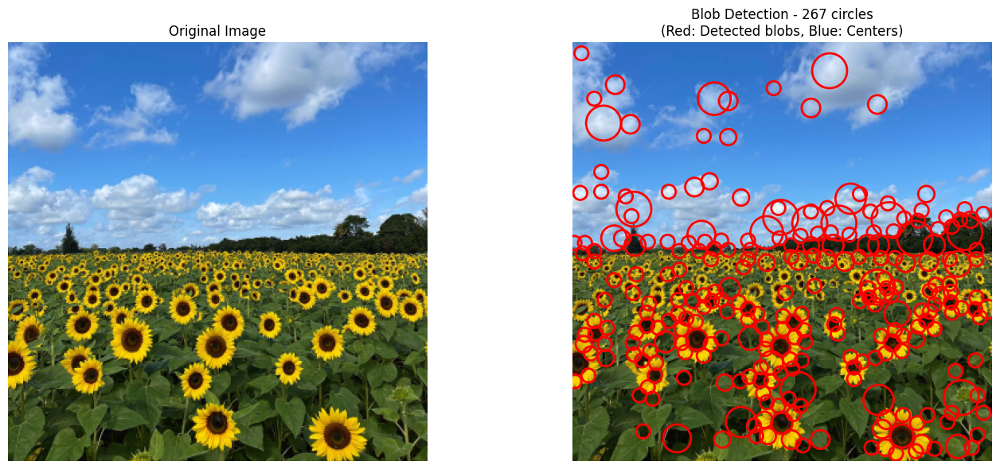


Top 5 largest blobs:
Rank | Center (x,y) | Radius | Sigma | Response
-------------------------------------------------------
   1 | (303.0, 239.0) |    6.0 |  4.24 | 0.1253
   2 | (106.0, 255.0) |    9.0 |  6.36 | 0.1174
   3 | (161.0, 290.0) |    6.0 |  4.24 | 0.1168
   4 | (241.0, 279.0) |    6.0 |  4.24 | 0.1152
   5 | (150.0, 229.0) |    6.0 |  4.24 | 0.1140

Visualizing LoG kernels...


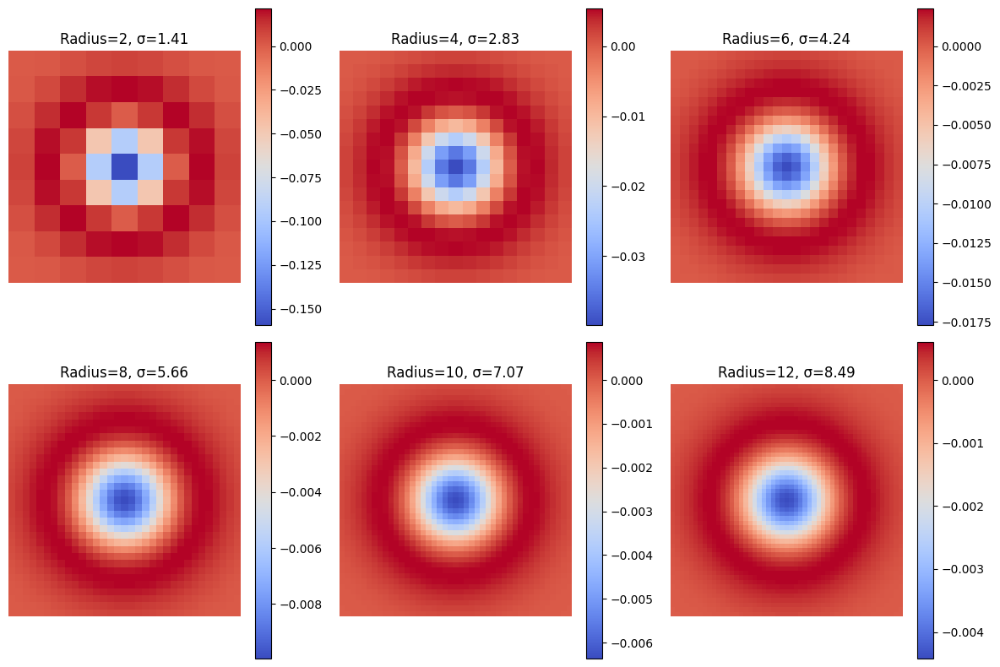


Visualizing responses at different scales...


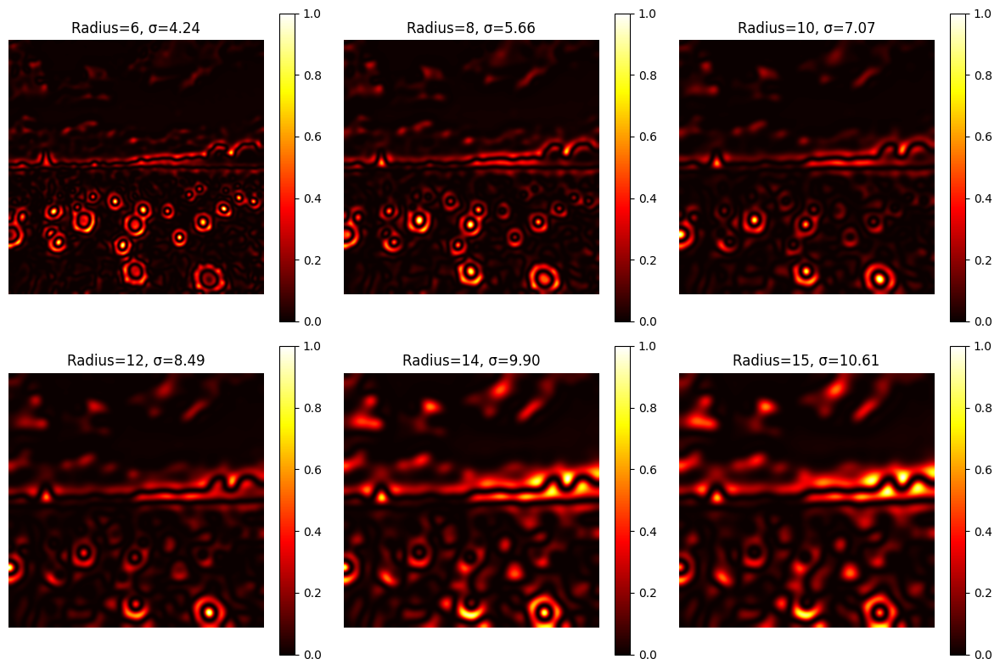

In [71]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def create_laplacian_of_gaussian_kernel(sigma):
    """
    Create CORRECT Laplacian of Gaussian kernel with proper normalization
    """
    # Determine kernel size (standard: 6*sigma)
    hw = int(3 * sigma)  # Half width
    size = 2 * hw + 1    # Ensure odd size
    
    # Create coordinate grid
    x = np.arange(-hw, hw + 1)
    y = np.arange(-hw, hw + 1)
    X, Y = np.meshgrid(x, y)
    
    # CORRECT Laplacian of Gaussian formula
    r_squared = X**2 + Y**2
    log_kernel = ((r_squared) / (2 * sigma**2) - 1) * np.exp(-r_squared / (2 * sigma**2)) / (np.pi * sigma**4)
    
    # Scale by sigma^2 for scale invariance
    scaled_log_kernel = (sigma ** 2) * log_kernel
    
    return scaled_log_kernel

# Load the image
im = cv.imread('the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)
gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)
gray = gray.astype(np.float32) / 255.0

print(f"Image size: {gray.shape}")

# Step 1: Define sigma values (now representing radii)
radius_start = 6
radius_end = 15
num_scales = 10
radii = np.arange(radius_start, radius_end + 1)
sigma_values = radii / np.sqrt(2)  # Convert radius to sigma: σ = r/√2

print(f"Radii: {radii}")
print(f"Sigma values: {sigma_values}")

# Step 2 & 3: Create scaled Laplacian of Gaussian kernels and convolve with image
h, w = gray.shape
scale_space = np.zeros((h, w, num_scales), dtype=np.float32)

for i, sigma in enumerate(sigma_values):
    print(f"Processing sigma = {sigma:.2f} (radius = {radii[i]})")
    
    # Create CORRECT scaled Laplacian of Gaussian kernel
    log_kernel = create_laplacian_of_gaussian_kernel(sigma)
    
    # Convolve with image and SQUARE the response
    response = cv.filter2D(gray, cv.CV_32F, log_kernel)
    squared_response = np.square(response)  # Make all responses positive
    
    # Store in scale space
    scale_space[:, :, i] = squared_response

# Step 4: Find LOCAL MAXIMA (not minima) in scale-space
blobs = []

# Search for local maxima in 3D scale space
for scale_idx in range(num_scales):
    sigma = sigma_values[scale_idx]
    radius = radii[scale_idx]  # Direct radius value
    current_response = scale_space[:, :, scale_idx]
    
    print(f"Finding maxima for radius={radius}, sigma={sigma:.2f}")
    
    # SIMPLE neighborhood search (3x3)
    k = 1  # Neighborhood size
    threshold = 0.01  # Adjust based on your image
    
    for y in range(k, h - k):
        for x in range(k, w - k):
            current_val = current_response[y, x]
            
            # Skip if below threshold
            if current_val < threshold:
                continue
            
            # Check if this is a local maximum in 3x3 neighborhood
            is_maximum = True
            for dy in range(-k, k + 1):
                for dx in range(-k, k + 1):
                    if dy == 0 and dx == 0:
                        continue
                    if current_response[y + dy, x + dx] > current_val:
                        is_maximum = False
                        break
                if not is_maximum:
                    break
            
            # Check scale-space: compare with adjacent scales
            if is_maximum and scale_idx > 0:
                if current_val < scale_space[y, x, scale_idx - 1]:
                    is_maximum = False
            
            if is_maximum and scale_idx < num_scales - 1:
                if current_val < scale_space[y, x, scale_idx + 1]:
                    is_maximum = False
            
            # If it's a true 3D maximum, record it
            if is_maximum:
                blobs.append((x, y, radius, sigma, current_val))

print(f"Found {len(blobs)} blob candidates")

# Remove duplicates - keep the strongest response for each location
final_blobs = []

# Sort by response strength (strongest first)
blobs.sort(key=lambda x: x[4], reverse=True)

for blob in blobs:
    x, y, radius, sigma, response = blob
    
    # Check if this location is already used
    location_used = False
    for existing_x, existing_y, existing_radius, _, _ in final_blobs:
        distance = np.sqrt((x - existing_x)**2 + (y - existing_y)**2)
        # If centers are closer than the smaller radius, skip
        if distance < min(radius, existing_radius):
            location_used = True
            break
    
    if not location_used:
        final_blobs.append(blob)

print(f"After duplicate removal: {len(final_blobs)} blobs")

# Step 5: Draw circles on output image using matplotlib
plt.figure(figsize=(15, 6))

# Create subplot for original image
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

# Create subplot for detected blobs
plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
ax = plt.gca()

# Draw all detected blobs
for i, (x, y, radius, sigma, response) in enumerate(final_blobs):
    # Draw circle
    circle = plt.Circle((x, y), radius, color='red', linewidth=2, fill=False)
    ax.add_patch(circle)
    
    # Draw center point
    #plt.plot(x, y, 'b+', markersize=8, markeredgewidth=2)

plt.title(f"Blob Detection - {len(final_blobs)} circles\n(Red: Detected blobs, Blue: Centers)")
plt.axis('off')

plt.tight_layout()
plt.show()

# Report results
if final_blobs:
    print(f"\nTop 5 largest blobs:")
    print("Rank | Center (x,y) | Radius | Sigma | Response")
    print("-" * 55)
    for i, (x, y, radius, sigma, response) in enumerate(final_blobs[:5]):
        print(f"{i+1:4d} | ({x:5.1f}, {y:5.1f}) | {radius:6.1f} | {sigma:5.2f} | {response:.4f}")

# Optional: Visualize LoG kernels for different scales
print(f"\nVisualizing LoG kernels...")
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
sample_radii = [2, 4, 6, 8, 10, 12]  # Sample radii to visualize
sample_sigmas = [r / np.sqrt(2) for r in sample_radii]

for i, (radius, sigma) in enumerate(zip(sample_radii, sample_sigmas)):
    if i < 6:
        kernel = create_laplacian_of_gaussian_kernel(sigma)
        ax = axes[i//3, i%3]
        im_plot = ax.imshow(kernel, cmap='coolwarm')
        ax.set_title(f'Radius={radius}, σ={sigma:.2f}')
        ax.axis('off')
        plt.colorbar(im_plot, ax=ax)

plt.tight_layout()
plt.show()

# Additional: Show response images at different scales
print(f"\nVisualizing responses at different scales...")
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
sample_scale_indices = [0, 2, 4, 6, 8, 9]  # Sample scales to visualize

for i, scale_idx in enumerate(sample_scale_indices):
    if i < 6:
        ax = axes[i//3, i%3]
        response_img = scale_space[:, :, scale_idx]
        # Normalize for visualization
        response_normalized = (response_img - response_img.min()) / (response_img.max() - response_img.min())
        im_plot = ax.imshow(response_normalized, cmap='hot')
        ax.set_title(f'Radius={radii[scale_idx]}, σ={sigma_values[scale_idx]:.2f}')
        ax.axis('off')
        plt.colorbar(im_plot, ax=ax)

plt.tight_layout()
plt.show()

Image size: (360, 360)
Radii: [2 3 4 5 6 7 8 9]
Sigma values: [1.41421356 2.12132034 2.82842712 3.53553391 4.24264069 4.94974747
 5.65685425 6.36396103]
Processing sigma = 1.41 (radius = 2)
Processing sigma = 2.12 (radius = 3)
Processing sigma = 2.83 (radius = 4)
Processing sigma = 3.54 (radius = 5)
Processing sigma = 4.24 (radius = 6)
Processing sigma = 4.95 (radius = 7)
Processing sigma = 5.66 (radius = 8)
Processing sigma = 6.36 (radius = 9)
Finding maxima for radius=2, sigma=1.41
Finding maxima for radius=3, sigma=2.12
Finding maxima for radius=4, sigma=2.83
Finding maxima for radius=5, sigma=3.54
Finding maxima for radius=6, sigma=4.24
Finding maxima for radius=7, sigma=4.95
Finding maxima for radius=8, sigma=5.66
Finding maxima for radius=9, sigma=6.36
Found 52 blob candidates
After duplicate removal: 52 blobs


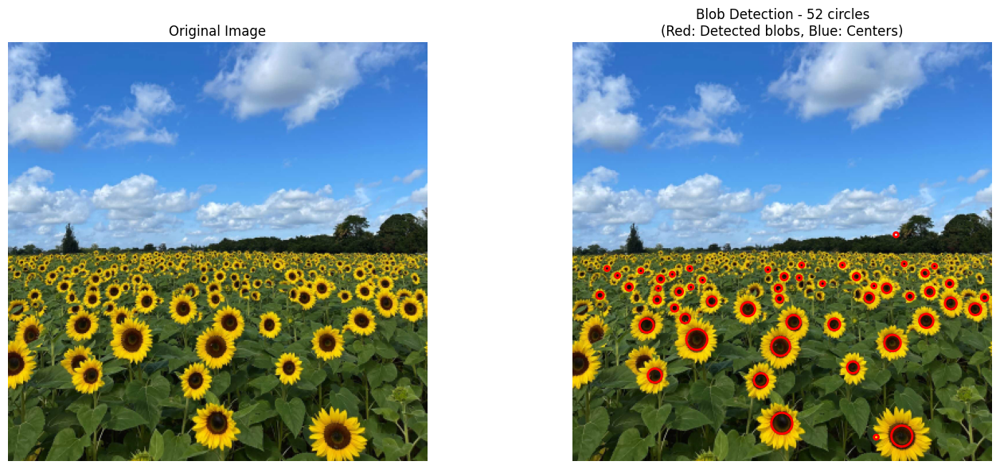


Top 5 largest blobs:
Rank | Center (x,y) | Radius | Sigma | Response
-------------------------------------------------------
   1 | (258.0, 209.0) |    2.0 |  1.41 | 0.1447
   2 | (323.0, 207.0) |    3.0 |  2.12 | 0.1433
   3 | (269.0, 211.0) |    4.0 |  2.83 | 0.1368
   4 | (306.0, 214.0) |    4.0 |  2.83 | 0.1271
   5 | (119.0, 222.0) |    4.0 |  2.83 | 0.1268

Visualizing LoG kernels...


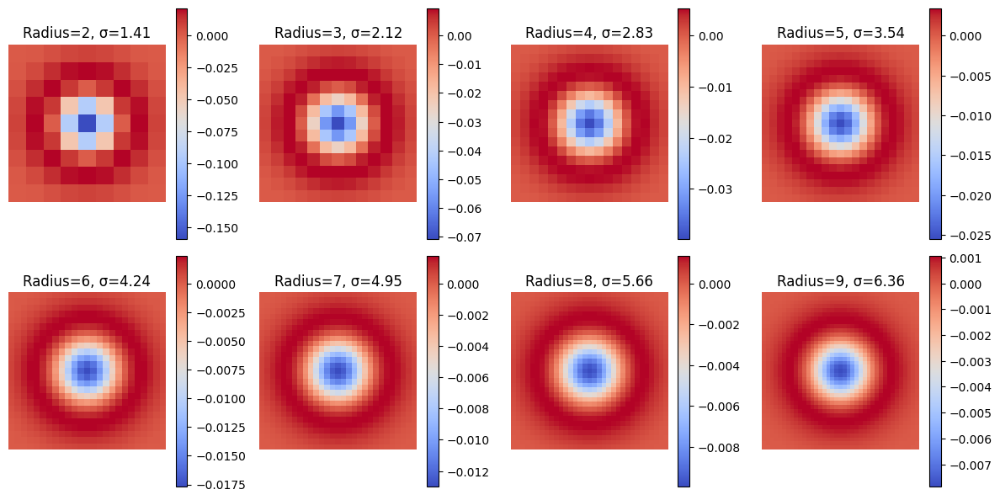


Visualizing responses at different scales...


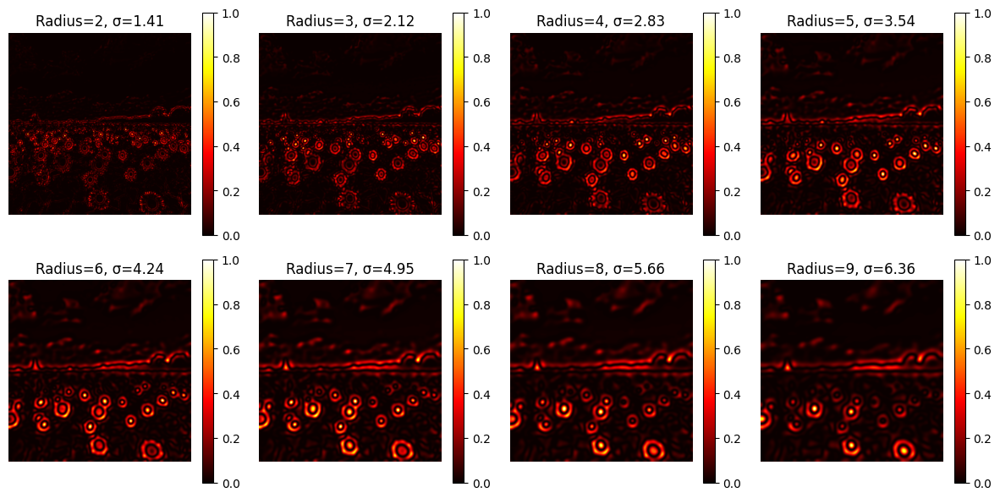

In [89]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def create_laplacian_of_gaussian_kernel(sigma):
    """
    Create CORRECT Laplacian of Gaussian kernel with proper normalization
    """
    # Determine kernel size (standard: 6*sigma)
    hw = int(3 * sigma)  # Half width
    size = 2 * hw + 1    # Ensure odd size
    
    # Create coordinate grid
    x = np.arange(-hw, hw + 1)
    y = np.arange(-hw, hw + 1)
    X, Y = np.meshgrid(x, y)
    
    # CORRECT Laplacian of Gaussian formula
    r_squared = X**2 + Y**2
    log_kernel = ((r_squared) / (2 * sigma**2) - 1) * np.exp(-r_squared / (2 * sigma**2)) / (np.pi * sigma**4)
    
    # Scale by sigma^2 for scale invariance
    scaled_log_kernel = (sigma ** 2) * log_kernel
    
    return scaled_log_kernel

# Load the image
im = cv.imread('the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)
gray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)
gray = gray.astype(np.float32) / 255.0

print(f"Image size: {gray.shape}")

# Step 1: Define sigma values (now representing radii) - CHANGED TO 6-10
radius_start = 2
radius_end = 9  # CHANGED FROM 15 TO 10
num_scales = radius_end-radius_start+1   # CHANGED FROM 10 TO 5 (since we have fewer radii)
radii = np.arange(radius_start, radius_end + 1)
sigma_values = radii / np.sqrt(2)  # Convert radius to sigma: σ = r/√2

print(f"Radii: {radii}")
print(f"Sigma values: {sigma_values}")

# Step 2 & 3: Create scaled Laplacian of Gaussian kernels and convolve with image
h, w = gray.shape
scale_space = np.zeros((h, w, num_scales), dtype=np.float32)

for i, sigma in enumerate(sigma_values):
    print(f"Processing sigma = {sigma:.2f} (radius = {radii[i]})")
    
    # Create CORRECT scaled Laplacian of Gaussian kernel
    log_kernel = create_laplacian_of_gaussian_kernel(sigma)
    
    # Convolve with image and SQUARE the response
    response = cv.filter2D(gray, cv.CV_32F, log_kernel)
    squared_response = np.square(response)  # Make all responses positive
    
    # Store in scale space
    scale_space[:, :, i] = squared_response

# Step 4: Find LOCAL MAXIMA (not minima) in scale-space
blobs = []

# Search for local maxima in 3D scale space
for scale_idx in range(num_scales):
    sigma = sigma_values[scale_idx]
    radius = radii[scale_idx]  # Direct radius value
    current_response = scale_space[:, :, scale_idx]
    
    print(f"Finding maxima for radius={radius}, sigma={sigma:.2f}")
    
    # SIMPLE neighborhood search (3x3)
    k = 1  # Neighborhood size
    
    # NEW: Calculate adaptive threshold for each scale
    # Use percentile to automatically set threshold (removes sky blobs)
    scale_threshold = np.percentile(current_response, 99.97)  # Top 5% strongest responses
    
    for y in range(k, h - k):
        for x in range(k, w - k):
            current_val = current_response[y, x]
            
            # Skip if below threshold - NEW CONDITION TO REMOVE SKY BLOBS
            if current_val < scale_threshold:  # CHANGED FROM FIXED TO ADAPTIVE THRESHOLD
                continue
            
            # Check if this is a local maximum in 3x3 neighborhood
            is_maximum = True
            for dy in range(-k, k + 1):
                for dx in range(-k, k + 1):
                    if dy == 0 and dx == 0:
                        continue
                    if current_response[y + dy, x + dx] > current_val:
                        is_maximum = False
                        break
                if not is_maximum:
                    break
            
            # Check scale-space: compare with adjacent scales
            if is_maximum and scale_idx > 0:
                if current_val < scale_space[y, x, scale_idx - 1]:
                    is_maximum = False
            
            if is_maximum and scale_idx < num_scales - 1:
                if current_val < scale_space[y, x, scale_idx + 1]:
                    is_maximum = False
            
            # If it's a true 3D maximum, record it
            if is_maximum:
                blobs.append((x, y, radius, sigma, current_val))

print(f"Found {len(blobs)} blob candidates")

# Remove duplicates - keep the strongest response for each location
final_blobs = []

# Sort by response strength (strongest first)
blobs.sort(key=lambda x: x[4], reverse=True)

for blob in blobs:
    x, y, radius, sigma, response = blob
    
    # Check if this location is already used
    location_used = False
    for existing_x, existing_y, existing_radius, _, _ in final_blobs:
        distance = np.sqrt((x - existing_x)**2 + (y - existing_y)**2)
        # If centers are closer than the smaller radius, skip
        if distance < min(radius, existing_radius):
            location_used = True
            break
    
    if not location_used:
        final_blobs.append(blob)

print(f"After duplicate removal: {len(final_blobs)} blobs")

# Step 5: Draw circles on output image using matplotlib
plt.figure(figsize=(15, 6))

# Create subplot for original image
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

# Create subplot for detected blobs
plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
ax = plt.gca()

# Draw all detected blobs
for i, (x, y, radius, sigma, response) in enumerate(final_blobs):
    # Draw circle
    circle = plt.Circle((x, y), radius, color='red', linewidth=2, fill=False)
    ax.add_patch(circle)
    
    # Draw center point
    #plt.plot(x, y, 'b+', markersize=8, markeredgewidth=2)

plt.title(f"Blob Detection - {len(final_blobs)} circles\n(Red: Detected blobs, Blue: Centers)")
plt.axis('off')

plt.tight_layout()
plt.show()

# Report results
if final_blobs:
    print(f"\nTop 5 largest blobs:")
    print("Rank | Center (x,y) | Radius | Sigma | Response")
    print("-" * 55)
    for i, (x, y, radius, sigma, response) in enumerate(final_blobs[:5]):
        print(f"{i+1:4d} | ({x:5.1f}, {y:5.1f}) | {radius:6.1f} | {sigma:5.2f} | {response:.4f}")

# Optional: Visualize LoG kernels for different scales
print(f"\nVisualizing LoG kernels...")
fig, axes = plt.subplots(2, 4, figsize=(12, 6))  # CHANGED TO 3x3 GRID
sample_radii = radii  # CHANGED TO USE ALL RADII WE ACTUALLY USE
sample_sigmas = sigma_values  # CHANGED TO USE ALL SIGMAS WE ACTUALLY USE

for i, (radius, sigma) in enumerate(zip(sample_radii, sample_sigmas)):
    kernel = create_laplacian_of_gaussian_kernel(sigma)
    ax = axes[i//4, i%4]
    im_plot = ax.imshow(kernel, cmap='coolwarm')
    ax.set_title(f'Radius={radius}, σ={sigma:.2f}')
    ax.axis('off')
    plt.colorbar(im_plot, ax=ax)

# Hide any empty subplots if we have less than 9
for i in range(len(sample_radii)):
    axes[i//4, i%4].axis('off')

plt.tight_layout()
plt.show()

# Additional: Show response images at different scales
print(f"\nVisualizing responses at different scales...")
fig, axes = plt.subplots(2, 4, figsize=(12, 6))  # CHANGED TO 3x3 GRID
sample_scale_indices = list(range(num_scales))  # CHANGED TO SHOW ALL SCALES

for i, scale_idx in enumerate(sample_scale_indices):
    ax = axes[i//4, i%4]
    response_img = scale_space[:, :, scale_idx]
    # Normalize for visualization
    response_normalized = (response_img - response_img.min()) / (response_img.max() - response_img.min())
    im_plot = ax.imshow(response_normalized, cmap='hot')
    ax.set_title(f'Radius={radii[scale_idx]}, σ={sigma_values[scale_idx]:.2f}')
    ax.axis('off')
    plt.colorbar(im_plot, ax=ax)

# Hide any empty subplots if we have less than 9
for i in range(len(sample_scale_indices)):
    axes[i//4, i%4].axis('off')

plt.tight_layout()
plt.show()

In [90]:
import cv2
import numpy as np

# Load images (assuming they are in the current directory)
img1 = cv2.imread('graf/graf/img1.ppm', cv2.IMREAD_COLOR) # Target image (to be warped)
img5 = cv2.imread('graf/graf/img5.ppm', cv2.IMREAD_COLOR) # Base image (to stitch onto)

# 1. Initialize SIFT Detector
sift = cv2.SIFT_create()

# 2. Find Keypoints and Descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp5, des5 = sift.detectAndCompute(img5, None)

# 3. Feature Matching (using FLANN for speed)
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50) 
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(des1, des5, k=2)

# 4. Apply Lowe's Ratio Test
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Extract coordinates of the matched keypoints
src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp5[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

print(f"Total good matches found: {len(good_matches)}")

Total good matches found: 97


In [91]:
# H_opencv is the Homography matrix, mask_opencv indicates inliers/outliers
H_opencv, mask_opencv = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 3.0)

print("\n--- OpenCV RANSAC Homography ---")
print(H_opencv)

# --- Comparison with Dataset Homography ---
# Assuming the provided homography is loaded as a 3x3 NumPy array H_dataset
# You would need to load the ground truth H from the dataset files (if available).

# Example: If the dataset provided H is available:
# H_dataset = np.array([...]) 
# print("\n--- Dataset (Ground Truth) Homography ---")
# print(H_dataset)

# You can compare the two matrices (H_opencv and H_dataset) by looking at the 
# element-wise difference or the Frobenius norm of the difference (||H_opencv - H_dataset||_F).


--- OpenCV RANSAC Homography ---
[[ 2.93859777e-02 -2.11687842e-01  5.99478342e+01]
 [ 2.75716146e-01 -1.99333002e+00  5.63386099e+02]
 [ 4.90799742e-04 -3.53869130e-03  1.00000000e+00]]


In [92]:
# Get the corners of img1
h1, w1 = img1.shape[:2]
corners1 = np.float32([[0, 0], [w1, 0], [w1, h1], [0, h1]]).reshape(-1, 1, 2)

# Project the corners of img1 onto the coordinate system of img5
corners1_warped = cv2.perspectiveTransform(corners1, H_opencv)

# Calculate the size of the combined stitched image
[xmin, ymin] = np.int32(corners1_warped.min(axis=0).ravel() - 0.5)
[xmax, ymax] = np.int32(corners1_warped.max(axis=0).ravel() + 0.5)
xmin, ymin = min(0, xmin), min(0, ymin) # Ensure origin (0,0) is included

# Dimensions of img5
h5, w5 = img5.shape[:2]

# Stitching offset (to ensure img5 is not cropped)
offset_x, offset_y = -xmin, -ymin
final_w, final_h = max(xmax, w5) - xmin, max(ymax, h5) - ymin

# Translate the homography matrix to account for the stitching offset
H_translate = np.array([[1, 0, offset_x], [0, 1, offset_y], [0, 0, 1]])
H_final = H_translate @ H_opencv 

# 1. Warp img1 into the final canvas size
img1_warped = cv2.warpPerspective(img1, H_final, (final_w, final_h))

# 2. Create the final canvas and place img5
result_image = np.zeros((final_h, final_w, 3), dtype=np.uint8)
result_image[offset_y:h5 + offset_y, offset_x:w5 + offset_x] = img5

# Simple Blending (Replace img5 area with img1_warped content)
# Use a mask to only copy non-black pixels from the warped image
mask = np.any(img1_warped > 0, axis=2)
result_image[mask] = img1_warped[mask]

# Display the stitched image
cv2.imwrite('stitched_graffiti.png', result_image)

print("\nStitching complete. The resulting image is saved as 'stitched_graffiti.png'.")


Stitching complete. The resulting image is saved as 'stitched_graffiti.png'.


Best No. of Inliers (Custom RANSAC) = 22

--- Final Homography Matrix (Custom DLT/RANSAC) ---
[[-3.26272678e-01 -4.43322401e-01  2.74966736e+02]
 [-5.40065582e-01 -7.33813115e-01  4.55140991e+02]
 [-1.18658963e-03 -1.61227648e-03  1.00000000e+00]]


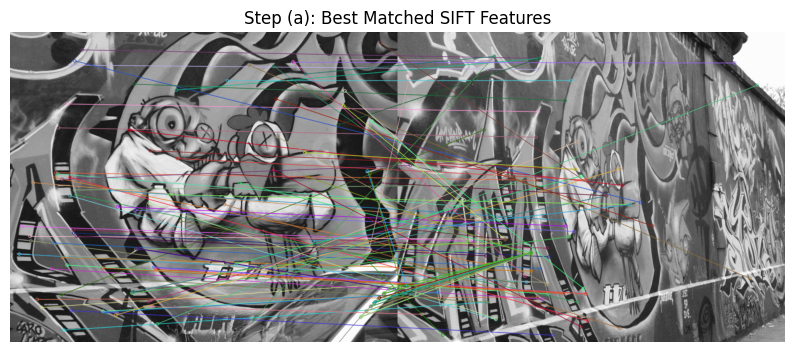

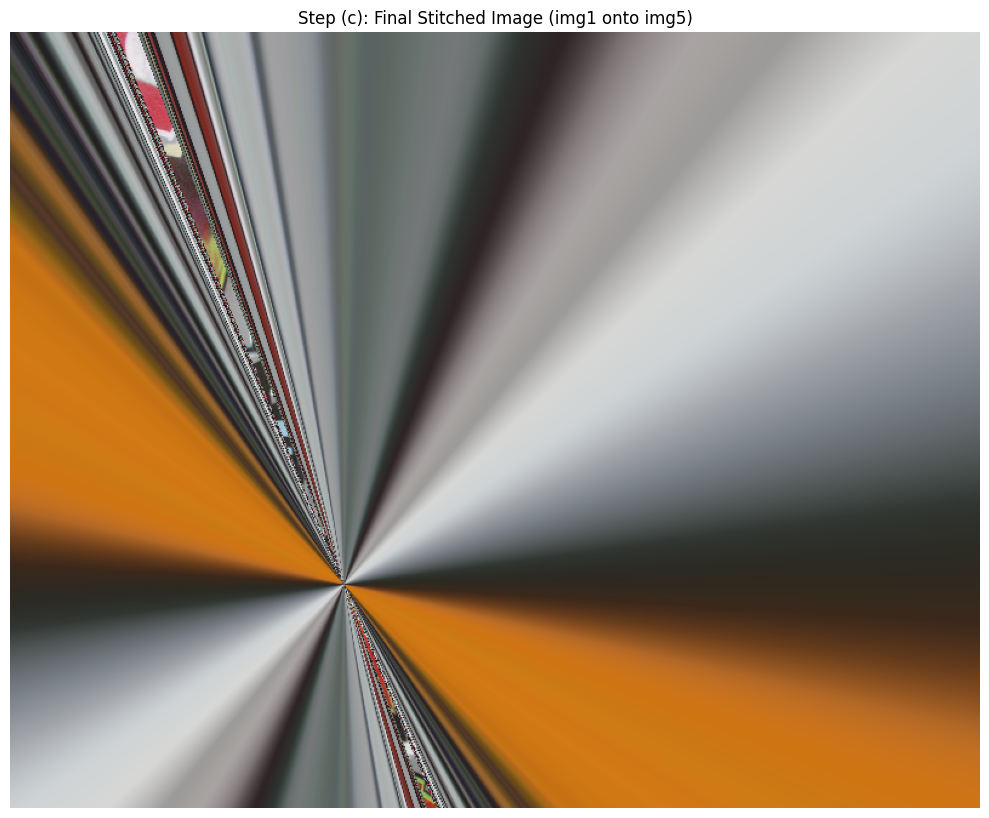


Stitching process completed successfully.


In [94]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform # Used for final warp function

# --- 1. SIFT Feature Detection and Matching ---

def get_sift_features(img1, img2):
    """Detects SIFT features and returns filtered matches."""
    # Convert to grayscale
    img1_gray = cv.cvtColor(img1, cv.COLOR_RGB2GRAY)
    img2_gray = cv.cvtColor(img2, cv.COLOR_RGB2GRAY)

    # Get SIFT descriptors
    sift = cv.SIFT_create(nOctaveLayers = 3, contrastThreshold = 0.09, edgeThreshold = 25, sigma = 1) 
    keypoints1, descriptors1 = sift.detectAndCompute(img1_gray, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2_gray, None)

    # Match using Brute Force Matcher
    bf = cv.BFMatcher()
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Lowe's ratio test to filter best matches
    best_matches = []
    for m,n in matches:
        if m.distance < 0.75*n.distance:
            best_matches.append(m)

    return best_matches, keypoints1, keypoints2

# --- 2. Custom Homography Calculation (DLT) ---

def compute_homography_dlt(src_points, dst_points):
    """
    Computes the 3x3 Homography matrix H using the Direct Linear Transform (DLT) 
    for 4 pairs of points (x, y) <-> (x', y').
    """
    if len(src_points) != 4:
        raise ValueError("DLT requires exactly 4 point pairs.")

    # Construct the 8x9 A matrix for the system Ah = 0
    A = []
    for i in range(4):
        x, y = src_points[i]
        x_prime, y_prime = dst_points[i]
        
        # Two rows generated per point correspondence
        A.append([-x, -y, -1, 0, 0, 0, x * x_prime, y * x_prime, x_prime])
        A.append([0, 0, 0, -x, -y, -1, x * y_prime, y * y_prime, y_prime])

    A = np.array(A)

    # Solve Ah = 0 using Singular Value Decomposition (SVD)
    # H is the eigenvector corresponding to the smallest singular value
    U, S, Vh = np.linalg.svd(A)
    H_flat = Vh[-1] # Last row of Vh is the solution
    
    # Reshape the 9 elements into the 3x3 Homography matrix
    H = H_flat.reshape(3, 3)
    # Normalize by the last element H[2, 2]
    H = H / H[2, 2]
    
    return H

# --- 3. Custom RANSAC Implementation ---

def get_inliers(src_full, dst_full, H, thres):
    """Checks all points against the proposed Homography H."""
    # Convert points to homogeneous coordinates (3xN)
    src_h = np.hstack((src_full, np.ones((src_full.shape[0], 1)))).T

    # Project points using H: [x', y', w']^T = H @ [x, y, 1]^T
    dst_projected_h = H @ src_h 

    # Convert back to Cartesian coordinates (2xN) by dividing by w'
    dst_projected = (dst_projected_h / dst_projected_h[2, :])[0:2, :].T

    # Calculate L2 distance (reprojection error)
    errors = np.linalg.norm(dst_projected - dst_full, axis=1)

    return np.where(errors < thres)[0]

def find_best_homography_custom_ransac(src_full, dst_full):
    """
    Performs the RANSAC loop to find the best Homography.
    """
    num_points = 4
    thres = 1.0 # Reprojection error threshold in pixels
    iters = 200 # Number of RANSAC iterations

    best_H = None
    best_inlier_count = 0
    best_inliers = None
    num_matches = len(src_full)

    for i in range(iters):
        # Randomly choose 4 indices
        indices = np.random.choice(num_matches, num_points, replace=False)

        src_points_sample = src_full[indices]
        dst_points_sample = dst_full[indices]

        # Compute Homography using DLT (custom function)
        H_candidate = compute_homography_dlt(src_points_sample, dst_points_sample)
        
        # Check all matches against the candidate H
        inliers = get_inliers(src_full, dst_full, H_candidate, thres)

        if len(inliers) > best_inlier_count:
            best_inlier_count = len(inliers)
            best_H = H_candidate
            best_inliers = inliers

    print(f'Best No. of Inliers (Custom RANSAC) = {best_inlier_count}')
    
    # Final refinement: Recompute H using all the best inliers found
    if best_inliers is not None and len(best_inliers) >= 4:
        src_inliers = src_full[best_inliers]
        dst_inliers = dst_full[best_inliers]
        
        # Use OpenCV's least-squares calculation (flag=0) for a final robust fit
        H_final, _ = cv.findHomography(src_inliers, dst_inliers, 0)
    else:
        H_final = best_H

    return H_final, best_inliers

# --- 4. Main Execution and Stitching ---

# --- Setup ---
np.random.seed(62)
# Ensure the image paths are correct for your environment
img1 = cv.imread("graf/graf/img1.ppm")
assert img1 is not None
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB) # Image to be warped

img5 = cv.imread("graf/graf/img5.ppm")
assert img5 is not None
img5 = cv.cvtColor(img5, cv.COLOR_BGR2RGB) # Base image

# --- Step (a): SIFT Features ---
best_matches, keypoints1, keypoints5 = get_sift_features(img1, img5)

# Array of all the matching points (used by RANSAC)
src_full = np.float32([keypoints1[m.queryIdx].pt for m in best_matches]).reshape(-1, 2)
dst_full = np.float32([keypoints5[m.trainIdx].pt for m in best_matches]).reshape(-1, 2)

# --- Step (b): Homography with Custom RANSAC ---
H_ransac, _ = find_best_homography_custom_ransac(src_full, dst_full)
print("\n--- Final Homography Matrix (Custom DLT/RANSAC) ---")
print(H_ransac)

# Convert H to a ProjectiveTransform object for skimage warping
tform = transform.ProjectiveTransform(H_ransac)

# --- Step (c): Stitching ---

# Determine the size of the final stitched canvas
# Get corners of img1
h1, w1 = img1.shape[:2]
corners1 = np.float32([[0, 0], [w1, 0], [w1, h1], [0, h1]]).reshape(-1, 1, 2)

# Project the corners of img1 using the Homography
corners1_warped = cv.perspectiveTransform(corners1, H_ransac)
corners1_warped = corners1_warped.reshape(-1, 2)

# Find min/max coordinates for the new canvas
h5, w5 = img5.shape[:2]
all_corners = np.vstack(([[0, 0], [w5, 0], [w5, h5], [0, h5]], corners1_warped))

[xmin, ymin] = np.int32(all_corners.min(axis=0))
[xmax, ymax] = np.int32(all_corners.max(axis=0))

final_w = xmax - xmin
final_h = ymax - ymin

# Translate the homography matrix to account for the stitching offset
offset_x, offset_y = -xmin, -ymin
H_translate = np.array([[1, 0, offset_x], [0, 1, offset_y], [0, 0, 1]])
H_final = H_translate @ H_ransac

# Warp img1 into the final canvas using the translated Homography
img1_warped = transform.warp(img1, np.linalg.inv(H_final), output_shape=(final_h, final_w))

# Create the final canvas and place img5
stitched_image = np.copy(img1_warped) # Start with the warped image
stitched_image = (stitched_image * 255).astype(np.uint8)

# Place img5 onto the canvas at its offset position
offset_slice = stitched_image[offset_y:h5 + offset_y, offset_x:w5 + offset_x]

# Create mask for img5 area
mask5 = np.any(offset_slice == 0, axis=2) 
mask5 = np.stack((mask5,) * 3, axis=-1)

# Blend: Place img5 where the warped img1 is black (i.e., outside img1's projection)
offset_slice[mask5] = img5[mask5]

# --- Display Results ---

# Display Matches
plt.figure(figsize=(10, 5))
matched_img = cv.drawMatches(cv.cvtColor(img1, cv.COLOR_RGB2GRAY), keypoints1, cv.cvtColor(img5, cv.COLOR_RGB2GRAY), keypoints5, best_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(matched_img)
plt.title("Step (a): Best Matched SIFT Features")
plt.axis('off')

# Display Stitched Image
plt.figure(figsize = (10, 10))
plt.imshow(stitched_image)
plt.title("Step (c): Final Stitched Image (img1 onto img5)")
plt.axis('off')
plt.tight_layout()
plt.show()

print("\nStitching process completed successfully.")

Detected 2678 keypoints in img1 and 3504 keypoints in img3.
Found 519 good matches.


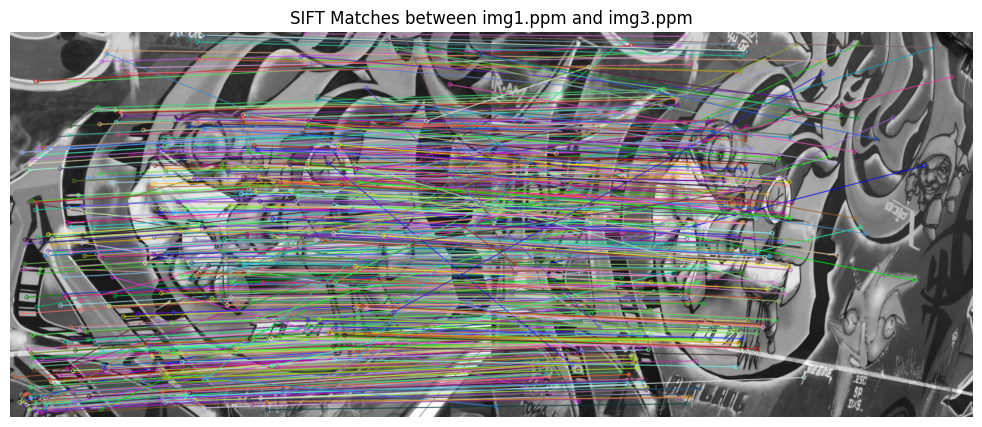

In [96]:
import cv2
import numpy as np
import matplotlib.pyplot as plt  # For visualization

# Load images in grayscale
img1 = cv2.imread('graf/graf/img1.ppm', cv2.IMREAD_GRAYSCALE)
img3 = cv2.imread('graf/graf/img3.ppm', cv2.IMREAD_GRAYSCALE)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img3, None)

print(f"Detected {len(kp1)} keypoints in img1 and {len(kp2)} keypoints in img3.")

# Match descriptors using BFMatcher with Lowe's ratio test
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test to get good matches
good_matches = []
for match_pair in matches:
    if len(match_pair) == 2:
        m, n = match_pair
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

print(f"Found {len(good_matches)} good matches.")

# Visualize matches
img_matches = cv2.drawMatches(img1, kp1, img3, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(15, 5))
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title('SIFT Matches between img1.ppm and img3.ppm')
plt.axis('off')
plt.show()

In [98]:
from scipy.io import loadmat
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Assuming src_pts, dst_pts, and good_matches are already computed from part (a)
# If not, ensure you have run the SIFT feature detection and matching code from part (a)

# DLT function to compute homography from 4+ points
def dlt_homography(src_pts, dst_pts):
    """
    Compute homography using DLT (SVD on A h = 0).
    src_pts, dst_pts: Nx2 numpy arrays.
    Returns 3x3 homography matrix.
    """
    N = src_pts.shape[0]
    if N < 4:
        return None
    
    A = np.zeros((2 * N, 9))
    for i in range(N):
        x, y = src_pts[i]
        u, v = dst_pts[i]
        A[2 * i] = np.array([0, 0, 0, -x, -y, -1, v * x, v * y, v])
        A[2 * i + 1] = np.array([-u, -v, -1, 0, 0, 0, x, y, 1])
    
    _, _, V = np.linalg.svd(A)
    H = V[-1].reshape(3, 3)
    H /= H[2, 2]  # Normalize scale
    return H

# RANSAC implementation
def ransac_homography(src_pts, dst_pts, max_iters=2000, thresh=5.0, min_inliers=10):
    """
    RANSAC for homography.
    Returns best H and inlier count.
    """
    src_flat = src_pts.reshape(-1, 2)
    dst_flat = dst_pts.reshape(-1, 2)
    N = len(src_flat)
    
    best_H = None
    best_inliers = 0
    best_inlier_mask = None
    
    for _ in range(max_iters):
        idx = np.random.choice(N, 4, replace=False)
        sample_src = src_flat[idx]
        sample_dst = dst_flat[idx]
        
        H = dlt_homography(sample_src, sample_dst)
        if H is None:
            continue
        
        proj_pts_hom = cv2.perspectiveTransform(src_pts, H)
        proj_pts = proj_pts_hom.reshape(-1, 2)
        
        errors = np.sqrt(np.sum((proj_pts - dst_flat)**2, axis=1))
        inliers = np.sum(errors < thresh)
        
        if inliers > best_inliers:
            best_inliers = inliers
            best_H = H
            best_inlier_mask = errors < thresh
    
    if best_inliers >= min_inliers:
        inlier_src = src_flat[best_inlier_mask]
        inlier_dst = dst_flat[best_inlier_mask]
        best_H = dlt_homography(inlier_src, inlier_dst)
    
    return best_H, best_inliers

# Run RANSAC
H_ransac, num_inliers = ransac_homography(src_pts, dst_pts)
print(f"RANSAC found {num_inliers} inliers. Homography:\n{H_ransac}")

# Load given homography as text file
H_given = np.loadtxt('graf/graf/H1to3p').reshape(3, 3)
print(f"Given homography:\n{H_given}")

# Compare (Frobenius norm difference)
# Normalize H_ransac to match H_given's scale (if needed)
H_ransac /= H_ransac[2, 2]
diff = np.linalg.norm(H_ransac - H_given, 'fro')
print(f"Frobenius norm difference between computed and given H: {diff:.4f}")

# Optional: Visualize inliers
if num_inliers >= 10:  # Only visualize if we have inliers
    best_inlier_mask = (np.sqrt(np.sum((cv2.perspectiveTransform(src_pts, H_ransac).reshape(-1, 2) - dst_pts.reshape(-1, 2))**2, axis=1)) < 5.0)
    inlier_matches = [good_matches[i] for i in range(len(good_matches)) if best_inlier_mask[i]]
    img_inliers = cv2.drawMatches(img1, kp1, img3, kp2, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(15, 5))
    plt.imshow(cv2.cvtColor(img_inliers, cv2.COLOR_BGR2RGB))
    plt.title('Inlier Matches after RANSAC')
    plt.axis('off')
    plt.show()

RANSAC found 1 inliers. Homography:
[[ 2.02942392e-03 -6.55432083e-03  7.30521692e-02]
 [ 5.17869284e-01 -4.13748747e+00  6.26415742e+02]
 [-2.14812195e-04 -7.15300669e-03  1.00000000e+00]]
Given homography:
[[ 7.6285898e-01 -2.9922929e-01  2.2567123e+02]
 [ 3.3443473e-01  1.0143901e+00 -7.6999973e+01]
 [ 3.4663091e-04 -1.4364524e-05  1.0000000e+00]]
Frobenius norm difference between computed and given H: 738.7256


Detected 2678 keypoints in graf/graf/img1.ppm and 3922 keypoints in img5.
Found 87 good matches between graf/graf/img1.ppm and img5.


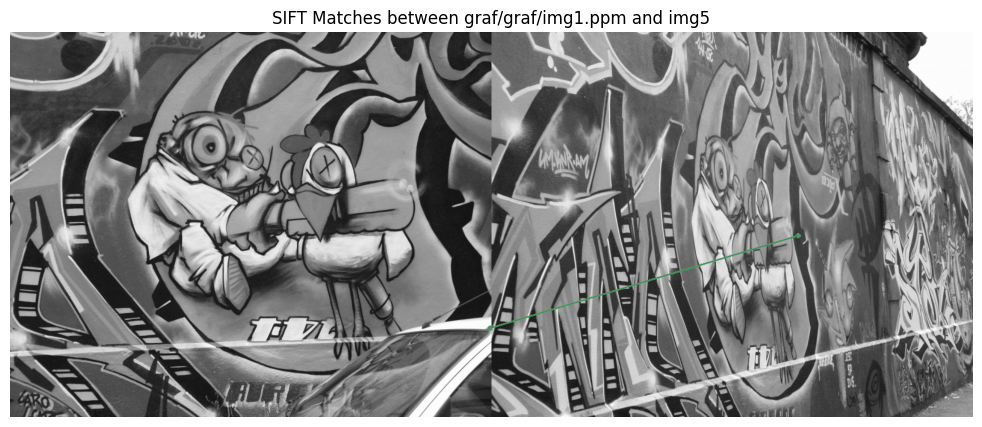

RANSAC found 0 inliers for graf/graf/img1.ppm to img5.
Custom RANSAC failed. Trying OpenCV's findHomography...


AttributeError: 'NoneType' object has no attribute 'astype'

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Set to True to stitch img3 onto img5, False for img1 onto img5
USE_IMG3 = False  # Change to False if you want img1

# Load color images for stitching
img_ref = 'graf/graf/img3.ppm' if USE_IMG3 else 'graf/graf/img1.ppm'
img1_color = cv2.imread(img_ref)
img5_color = cv2.imread('graf/graf/img5.ppm')

# Check if images loaded correctly
if img1_color is None or img5_color is None:
    raise FileNotFoundError(f"Failed to load {img_ref} or img5.ppm. Check file paths.")

# Load grayscale images for feature detection
img1 = cv2.imread(img_ref, cv2.IMREAD_GRAYSCALE)
img5_gray = cv2.imread('graf/graf/img5.ppm', cv2.IMREAD_GRAYSCALE)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp5, des5 = sift.detectAndCompute(img5_gray, None)

print(f"Detected {len(kp1)} keypoints in {img_ref} and {len(kp5)} keypoints in img5.")

# Match descriptors using BFMatcher with Lowe's ratio test
bf = cv2.BFMatcher()
matches_15 = bf.knnMatch(des1, des5, k=2)

# Apply ratio test to get good matches
good_matches_15 = [m for match_pair in matches_15 if len(match_pair) == 2 and match_pair[0].distance < 0.75 * match_pair[1].distance]
print(f"Found {len(good_matches_15)} good matches between {img_ref} and img5.")

# Visualize matches for debugging
img_matches = cv2.drawMatches(img1, kp1, img5_gray, kp5, good_matches_15, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(15, 5))
plt.imshow(img_matches, cmap='gray')
plt.title(f'SIFT Matches between {img_ref} and img5')
plt.axis('off')
plt.show()

# Check if enough matches for homography
if len(good_matches_15) < 4:
    raise ValueError(f"Not enough matches ({len(good_matches_15)} < 4) to compute homography. Try adjusting SIFT or matching parameters.")

# Extract points from good matches
src_pts_15 = np.float32([kp1[m.queryIdx].pt for m in good_matches_15]).reshape(-1, 1, 2)
dst_pts_15 = np.float32([kp5[m.trainIdx].pt for m in good_matches_15]).reshape(-1, 1, 2)

# RANSAC function
def dlt_homography(src_pts, dst_pts):
    N = src_pts.shape[0]
    if N < 4:
        return None
    A = np.zeros((2 * N, 9))
    for i in range(N):
        x, y = src_pts[i]
        u, v = dst_pts[i]
        A[2 * i] = np.array([0, 0, 0, -x, -y, -1, v * x, v * y, v])
        A[2 * i + 1] = np.array([-u, -v, -1, 0, 0, 0, x, y, 1])
    _, _, V = np.linalg.svd(A)
    H = V[-1].reshape(3, 3)
    H /= H[2, 2]
    return H

def ransac_homography(src_pts, dst_pts, max_iters=5000, thresh=10.0, min_inliers=4):
    src_flat = src_pts.reshape(-1, 2)
    dst_flat = dst_pts.reshape(-1, 2)
    N = len(src_flat)
    best_H = None
    best_inliers = 0
    best_inlier_mask = None
    for _ in range(max_iters):
        idx = np.random.choice(N, 4, replace=False)
        sample_src = src_flat[idx]
        sample_dst = dst_flat[idx]
        H = dlt_homography(sample_src, sample_dst)
        if H is None:
            continue
        proj_pts_hom = cv2.perspectiveTransform(src_pts, H)
        proj_pts = proj_pts_hom.reshape(-1, 2)
        errors = np.sqrt(np.sum((proj_pts - dst_flat)**2, axis=1))
        inliers = np.sum(errors < thresh)
        if inliers > best_inliers:
            best_inliers = inliers
            best_H = H
            best_inlier_mask = errors < thresh
    if best_inliers >= min_inliers:
        inlier_src = src_flat[best_inlier_mask]
        inlier_dst = dst_flat[best_inlier_mask]
        best_H = dlt_homography(inlier_src, inlier_dst)
    print(f"RANSAC found {best_inliers} inliers for {img_ref} to img5.")
    return best_H, best_inliers

# Try custom RANSAC
H_15, num_inliers = ransac_homography(src_pts_15, dst_pts_15)

# Fallback to OpenCV's findHomography if custom RANSAC fails
if H_15 is None or num_inliers < 4:
    print("Custom RANSAC failed. Trying OpenCV's findHomography...")
    H_15, mask = cv2.findHomography(src_pts_15, dst_pts_15, cv2.RANSAC, ransacReprojThreshold=10.0)
    num_inliers = np.sum(mask) if mask is not None else 0
    if H_15 is None or num_inliers < 4:
        raise ValueError(f"Both custom and OpenCV RANSAC failed. Only {num_inliers} inliers found. Check images or matches.")

# Ensure H_15 is float32 for OpenCV
H_15 = H_15.astype(np.float32)
print(f"Computed homography ({img_ref} to img5):\n{H_15}")

# Warp image to img5's canvas
h, w = img5_color.shape[:2]
warped_img1 = cv2.warpPerspective(img1_color, H_15, (w, h))

# Simple alpha blending
mask_warped = cv2.cvtColor(warped_img1, cv2.COLOR_BGR2GRAY) > 0
mask_img5 = cv2.cvtColor(img5_color, cv2.COLOR_BGR2GRAY) > 0
overlap = mask_warped & mask_img5

stitched = img5_color.copy().astype(np.float32)
stitched[overlap] = 0.5 * img5_color[overlap].astype(np.float32) + 0.5 * warped_img1[overlap].astype(np.float32)
stitched[~mask_img5] = warped_img1[~mask_img5]
stitched = np.clip(stitched, 0, 255).astype(np.uint8)

# Save and visualize
output_file = f"stitched_{'img3' if USE_IMG3 else 'img1'}_on_img5.ppm"
cv2.imwrite(output_file, stitched)
plt.figure(figsize=(15, 5))
plt.imshow(cv2.cvtColor(stitched, cv2.COLOR_BGR2RGB))
plt.title(f'Stitched: {img_ref} warped onto img5')
plt.axis('off')
plt.show()

# new

Found 283 good matches.


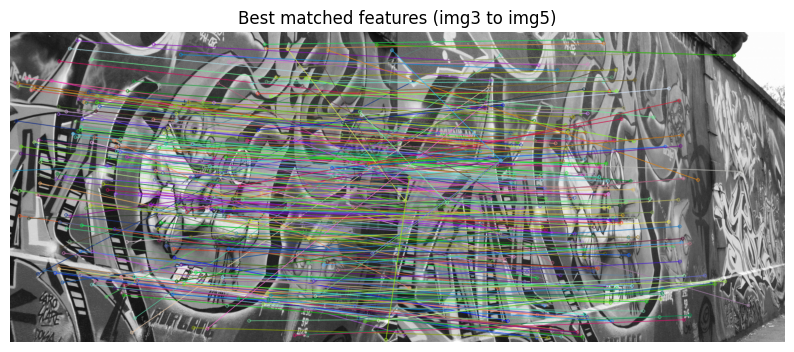

Best no. of inliers = 210


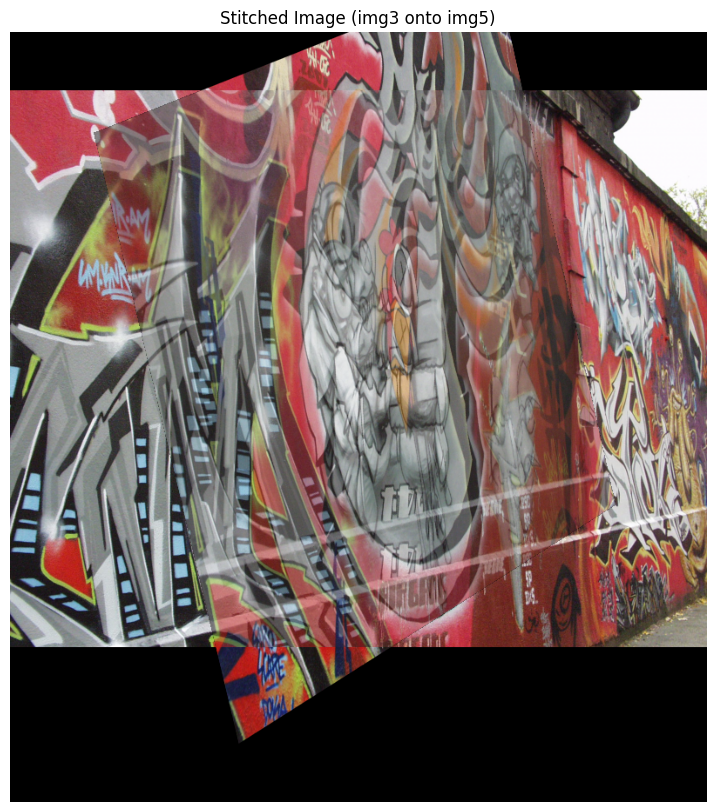

In [108]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform  # Keep for compatibility, but use OpenCV for warping

# Set to True to stitch img3 onto img5, False for img1
USE_IMG3 = True  # Change to False if you want img1

# Load images
img_ref = 'graf/graf/img3.ppm' if USE_IMG3 else 'a2images/graf/img1.ppm'
img1 = cv2.imread(img_ref)
img5 = cv2.imread('graf/graf/img5.ppm')

# Check if images loaded
assert img1 is not None, f"Failed to load {img_ref}"
assert img5 is not None, "Failed to load img5.ppm"

# Convert to RGB for consistency
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

def get_sift_features(img1, img2):
    # Convert to grayscale
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

    # Get SIFT descriptors
    sift = cv2.SIFT_create(nOctaveLayers=3, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6)  # Default SIFT params
    keypoints1, descriptors1 = sift.detectAndCompute(img1_gray, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2_gray, None)

    # Check if descriptors are valid
    if descriptors1 is None or descriptors2 is None:
        raise ValueError("No descriptors found in one or both images.")

    # Match using Brute Force Matcher
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    # Lowe's ratio to filter best matches
    best_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]

    return best_matches, keypoints1, keypoints2

def get_inliers(src_full, dst_full, tform, thres):
    dst_check = tform(src_full)
    errors = np.sqrt(np.sum((dst_check - dst_full) ** 2, axis=1))
    return np.where(errors < thres)[0]

def find_best_homography(good_matches, keypoints1, keypoints2):
    # Array of matching points
    src_full = np.array([keypoints1[m.queryIdx].pt for m in good_matches], dtype=np.float32)
    dst_full = np.array([keypoints2[m.trainIdx].pt for m in good_matches], dtype=np.float32)

    if len(src_full) < 4:
        raise ValueError(f"Not enough matches ({len(src_full)} < 4) to compute homography.")

    # RANSAC parameters
    num_points = 4
    thres = 5.0  # More lenient threshold
    iters = 2000  # More iterations
    min_inliers = 4  # Minimum inliers

    best_homography = None
    best_inlier_count = 0
    best_inliers = None

    np.random.seed(62)  # For reproducibility
    for i in range(iters):
        chosen_matches = np.random.choice(good_matches, num_points, replace=False)
        src_points = np.array([keypoints1[m.queryIdx].pt for m in chosen_matches], dtype=np.float32)
        dst_points = np.array([keypoints2[m.trainIdx].pt for m in chosen_matches], dtype=np.float32)

        try:
            tform = transform.estimate_transform('projective', src_points, dst_points)
            inliers = get_inliers(src_full, dst_full, tform, thres)
            if len(inliers) > best_inlier_count:
                best_inlier_count = len(inliers)
                best_homography = tform
                best_inliers = inliers
        except:
            continue

    # Refine homography using all inliers
    if best_inlier_count >= min_inliers:
        src_inliers = src_full[best_inliers]
        dst_inliers = dst_full[best_inliers]
        best_homography = transform.estimate_transform('projective', src_inliers, dst_inliers)
        print(f"Best no. of inliers = {best_inlier_count}")
    else:
        # Fallback to OpenCV's findHomography
        print("Custom RANSAC failed. Trying OpenCV's findHomography...")
        H, mask = cv2.findHomography(src_full, dst_full, cv2.RANSAC, ransacReprojThreshold=5.0)
        best_inlier_count = np.sum(mask) if mask is not None else 0
        if H is None or best_inlier_count < min_inliers:
            raise ValueError(f"RANSAC failed. Only {best_inlier_count} inliers found.")
        best_homography = transform.ProjectiveTransform(matrix=H)
        print(f"OpenCV RANSAC found {best_inlier_count} inliers.")

    return best_homography, best_inliers

# Get SIFT features and matches
good_matches, keypoints1, keypoints5 = get_sift_features(img1, img5)
print(f"Found {len(good_matches)} good matches.")

# Visualize matches
matched_img = cv2.drawMatches(cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY), keypoints1,
                              cv2.cvtColor(img5, cv2.COLOR_RGB2GRAY), keypoints5,
                              good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(10, 10))
plt.imshow(matched_img, cmap='gray')
plt.title(f"Best matched features ({'img3' if USE_IMG3 else 'img1'} to img5)")
plt.axis('off')
plt.show()

# Find homography
tform, inliers = find_best_homography(good_matches, keypoints1, keypoints5)

# Compute canvas size to avoid cropping
h1, w1 = img1.shape[:2]
h5, w5 = img5.shape[:2]
corners = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
warped_corners = cv2.perspectiveTransform(corners, tform.params)
min_x, min_y = np.int32(warped_corners.min(axis=0).ravel() - 0.5)
max_x, max_y = np.int32(warped_corners.max(axis=0).ravel() + 0.5)
canvas_w = max(max_x, w5) - min(min_x, 0)
canvas_h = max(max_y, h5) - min(min_y, 0)
offset_x, offset_y = -min_x if min_x < 0 else 0, -min_y if min_y < 0 else 0

# Warp img1 to img5's coordinate system
H = tform.params.astype(np.float32)
warped_img1 = cv2.warpPerspective(img1, H, (canvas_w, canvas_h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)

# Adjust img5 to the same canvas
translation = np.array([[1, 0, offset_x], [0, 1, offset_y], [0, 0, 1]], dtype=np.float32)
warped_img5 = cv2.warpPerspective(img5, translation, (canvas_w, canvas_h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)

# Alpha blending
mask_warped = cv2.cvtColor(warped_img1, cv2.COLOR_RGB2GRAY) > 0
mask_img5 = cv2.cvtColor(warped_img5, cv2.COLOR_RGB2GRAY) > 0
overlap = mask_warped & mask_img5

stitched = warped_img5.astype(np.float32)
stitched[mask_warped] = warped_img1[mask_warped].astype(np.float32)  # Prefer img1 where available
stitched[overlap] = 0.5 * warped_img5[overlap].astype(np.float32) + 0.5 * warped_img1[overlap].astype(np.float32)

stitched = np.clip(stitched, 0, 255).astype(np.uint8)

# Save and visualize
output_file = f"stitched_{'img3' if USE_IMG3 else 'img1'}_on_img5.ppm"
cv2.imwrite(output_file, cv2.cvtColor(stitched, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(10, 10))
plt.imshow(stitched)
plt.title(f"Stitched Image ({'img3' if USE_IMG3 else 'img1'} onto img5)")
plt.axis('off')
plt.show()

Found 283 good matches.


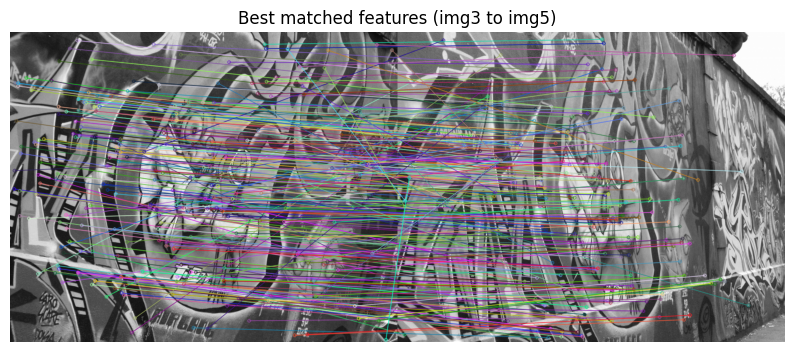

Custom RANSAC: Best no. of inliers = 210


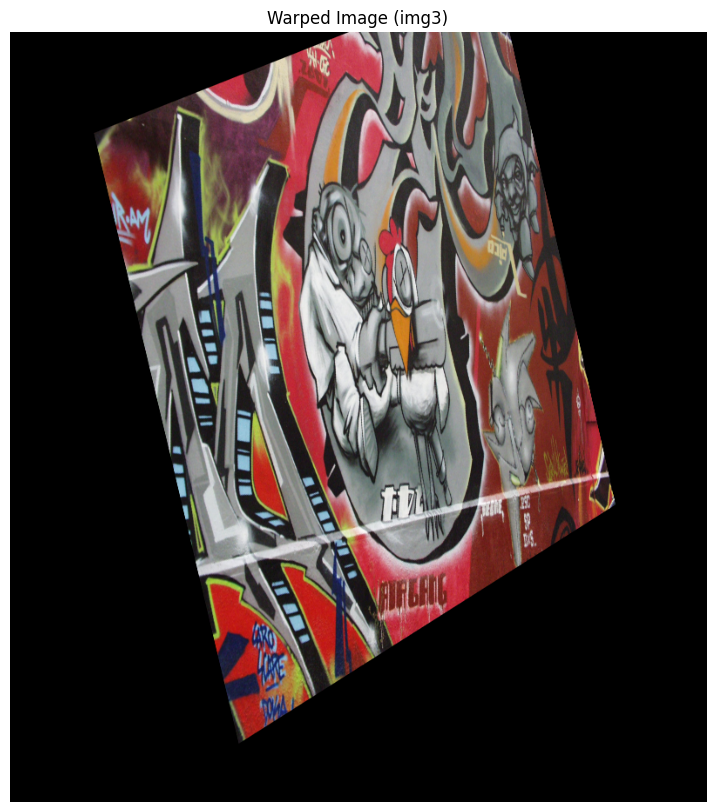

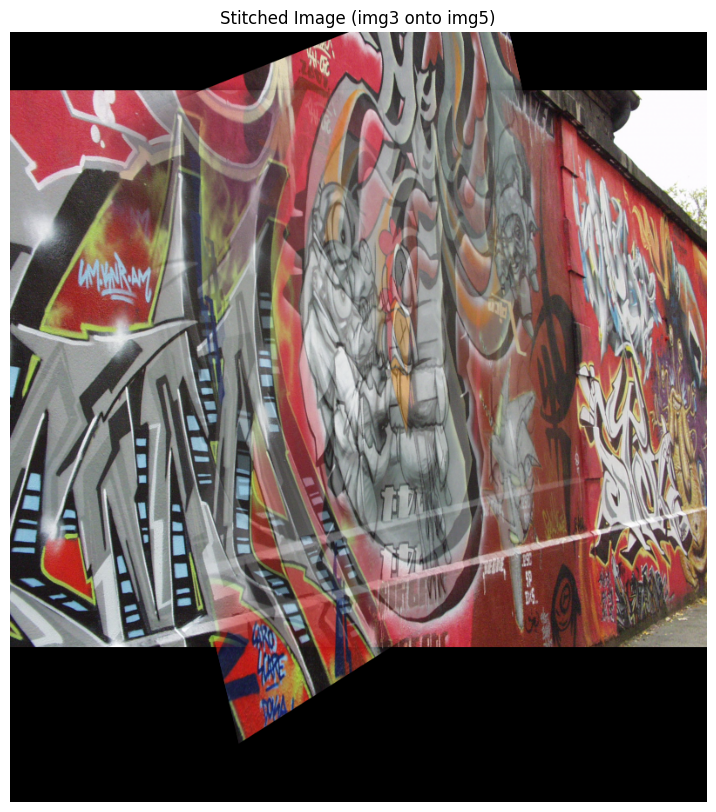

In [112]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform

# Set to True to stitch img3 onto img5, False for img1
USE_IMG3 = True

# Load images
img_ref = 'graf/graf/img3.ppm' if USE_IMG3 else 'graf/graf/img1.ppm'
img1 = cv2.imread(img_ref)
img5 = cv2.imread('graf/graf/img5.ppm')

# Check if images loaded
assert img1 is not None, f"Failed to load {img_ref}"
assert img5 is not None, "Failed to load img5.ppm"

# Convert to RGB for consistency
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

def get_sift_features(img1, img2):
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create(nOctaveLayers=3, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6)
    keypoints1, descriptors1 = sift.detectAndCompute(img1_gray, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2_gray, None)
    if descriptors1 is None or descriptors2 is None:
        raise ValueError("No descriptors found in one or both images.")
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    best_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]
    return best_matches, keypoints1, keypoints2

def get_inliers(src_full, dst_full, tform, thres):
    dst_check = tform(src_full)
    errors = np.sqrt(np.sum((dst_check - dst_full) ** 2, axis=1))
    return np.where(errors < thres)[0]

def find_best_homography(good_matches, keypoints1, keypoints2):
    src_full = np.array([keypoints1[m.queryIdx].pt for m in good_matches], dtype=np.float32)
    dst_full = np.array([keypoints2[m.trainIdx].pt for m in good_matches], dtype=np.float32)
    if len(src_full) < 4:
        raise ValueError(f"Not enough matches ({len(src_full)} < 4) to compute homography.")
    num_points = 4
    thres = 5.0
    iters = 2000
    min_inliers = 4
    best_homography = None
    best_inlier_count = 0
    best_inliers = None
    np.random.seed(62)
    for i in range(iters):
        chosen_matches = np.random.choice(good_matches, num_points, replace=False)
        src_points = np.array([keypoints1[m.queryIdx].pt for m in chosen_matches], dtype=np.float32)
        dst_points = np.array([keypoints2[m.trainIdx].pt for m in chosen_matches], dtype=np.float32)
        try:
            tform = transform.estimate_transform('projective', src_points, dst_points)
            inliers = get_inliers(src_full, dst_full, tform, thres)
            if len(inliers) > best_inlier_count:
                best_inlier_count = len(inliers)
                best_homography = tform
                best_inliers = inliers
        except:
            continue
    if best_inlier_count >= min_inliers:
        src_inliers = src_full[best_inliers]
        dst_inliers = dst_full[best_inliers]
        best_homography = transform.estimate_transform('projective', src_inliers, dst_inliers)
        print(f"Custom RANSAC: Best no. of inliers = {best_inlier_count}")
    else:
        print("Custom RANSAC failed. Trying OpenCV's findHomography...")
        H, mask = cv2.findHomography(src_full, dst_full, cv2.RANSAC, ransacReprojThreshold=5.0)
        best_inlier_count = np.sum(mask) if mask is not None else 0
        if H is None or best_inlier_count < min_inliers:
            raise ValueError(f"RANSAC failed. Only {best_inlier_count} inliers found.")
        best_homography = transform.ProjectiveTransform(matrix=H)
        print(f"OpenCV RANSAC found {best_inlier_count} inliers.")
    return best_homography, best_inliers

# Get SIFT features and matches
good_matches, keypoints1, keypoints5 = get_sift_features(img1, img5)
print(f"Found {len(good_matches)} good matches.")

# Visualize matches
matched_img = cv2.drawMatches(cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY), keypoints1,
                              cv2.cvtColor(img5, cv2.COLOR_RGB2GRAY), keypoints5,
                              good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(10, 10))
plt.imshow(matched_img, cmap='gray')
plt.title(f"Best matched features ({'img3' if USE_IMG3 else 'img1'} to img5)")
plt.axis('off')
plt.show()

# Find homography
tform, inliers = find_best_homography(good_matches, keypoints1, keypoints5)

# Compute canvas size
h1, w1 = img1.shape[:2]
h5, w5 = img5.shape[:2]
corners = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
warped_corners = cv2.perspectiveTransform(corners, tform.params)
min_x, min_y = np.int32(warped_corners.min(axis=0).ravel() - 0.5)
max_x, max_y = np.int32(warped_corners.max(axis=0).ravel() + 0.5)
canvas_w = max(max_x, w5) - min(min_x, 0)
canvas_h = max(max_y, h5) - min(min_y, 0)
offset_x, offset_y = -min_x if min_x < 0 else 0, -min_y if min_y < 0 else 0

# Warp img1 to img5's coordinate system
H = tform.params.astype(np.float32)
warped_img1 = cv2.warpPerspective(img1, H, (canvas_w, canvas_h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)

# Visualize warped image separately
plt.figure(figsize=(10, 10))
plt.imshow(warped_img1)
plt.title(f"Warped Image ({'img3' if USE_IMG3 else 'img1'})")
plt.axis('off')
plt.show()

# Adjust img5 to the same canvas
translation = np.array([[1, 0, offset_x], [0, 1, offset_y], [0, 0, 1]], dtype=np.float32)
warped_img5 = cv2.warpPerspective(img5, translation, (canvas_w, canvas_h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)

# Improved blending with feathering
mask_warped = cv2.cvtColor(warped_img1, cv2.COLOR_RGB2GRAY) > 0
mask_img5 = cv2.cvtColor(warped_img5, cv2.COLOR_RGB2GRAY) > 0
overlap = mask_warped & mask_img5

# Create distance-based weights for smoother blending
if np.any(overlap):
    kernel = np.ones((21, 21), np.float32)  # Larger kernel for smoother transition
    dist_warped = cv2.distanceTransform(mask_warped.astype(np.uint8), cv2.DIST_L2, 5)
    dist_img5 = cv2.distanceTransform(mask_img5.astype(np.uint8), cv2.DIST_L2, 5)
    dist_warped = cv2.filter2D(dist_warped, -1, kernel)  # Smooth the distance map
    dist_img5 = cv2.filter2D(dist_img5, -1, kernel)
    weight_warped = dist_warped / (dist_warped + dist_img5 + 1e-6)  # Avoid division by zero
    weight_img5 = dist_img5 / (dist_warped + dist_img5 + 1e-6)
    weight_warped = np.clip(weight_warped, 0, 1)[:, :, np.newaxis]
    weight_img5 = np.clip(weight_img5, 0, 1)[:, :, np.newaxis]
else:
    weight_warped = mask_warped.astype(np.float32)[:, :, np.newaxis]
    weight_img5 = mask_img5.astype(np.float32)[:, :, np.newaxis]

# Blend images
stitched = np.zeros_like(warped_img5, dtype=np.float32)
stitched = weight_warped * warped_img1.astype(np.float32) + weight_img5 * warped_img5.astype(np.float32)
stitched = np.clip(stitched, 0, 255).astype(np.uint8)

# Save and visualize final stitched image
output_file = f"stitched_{'img3' if USE_IMG3 else 'img1'}_on_img5.ppm"
cv2.imwrite(output_file, cv2.cvtColor(stitched, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(10, 10))
plt.imshow(stitched)
plt.title(f"Stitched Image ({'img3' if USE_IMG3 else 'img1'} onto img5)")
plt.axis('off')
plt.show()

Found 283 good matches.


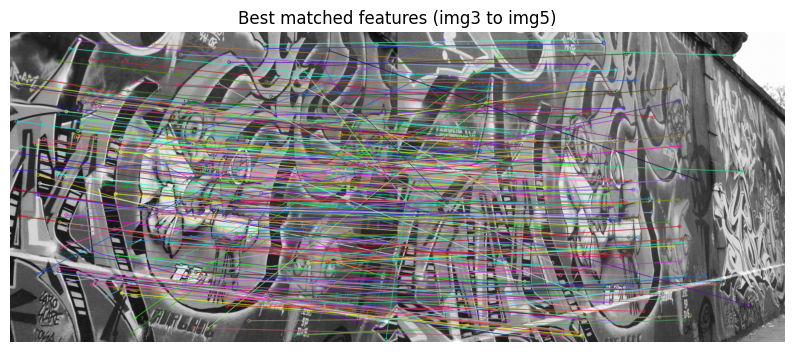

Custom RANSAC: Best no. of inliers = 219


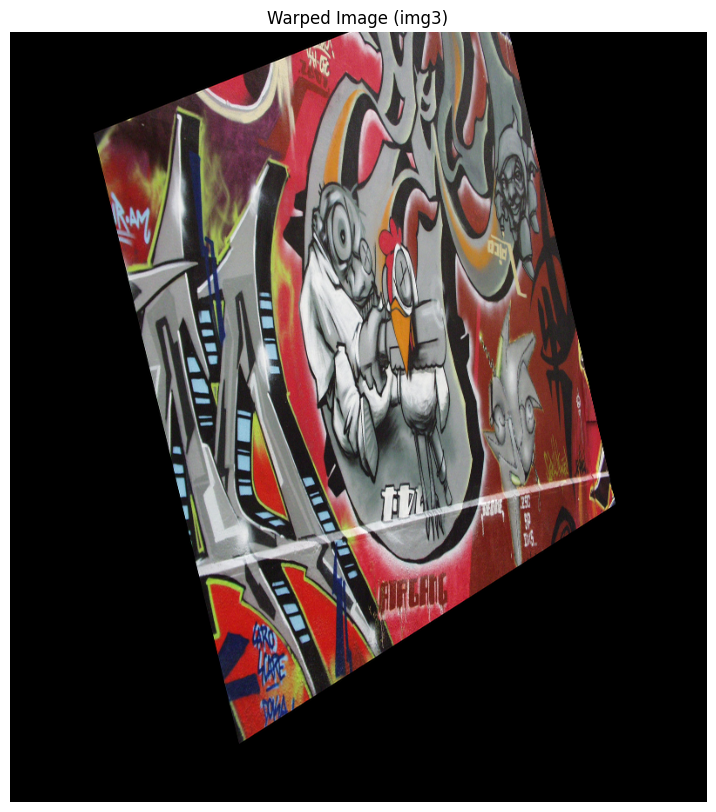

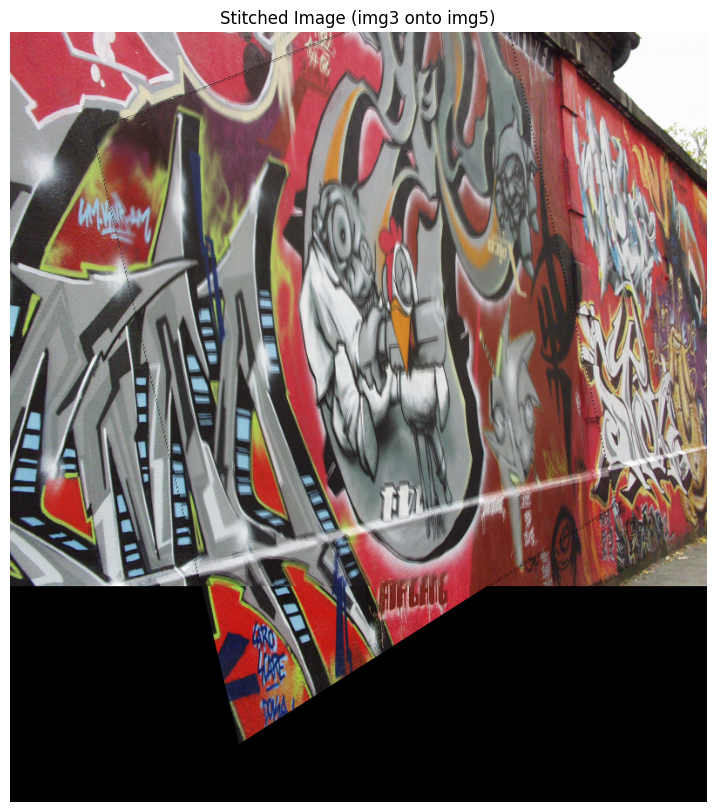

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform

# Set to True to stitch img3 onto img5, False for img1
USE_IMG3 = True

# Load images
img_ref = 'graf/graf/img3.ppm' if USE_IMG3 else 'graf/graf/img1.ppm'
img1 = cv2.imread(img_ref)
img5 = cv2.imread('graf/graf/img5.ppm')

# Check if images loaded
assert img1 is not None, f"Failed to load {img_ref}"
assert img5 is not None, "Failed to load img5.ppm"

# Convert to RGB for consistency
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

def get_sift_features(img1, img2):
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create(nOctaveLayers=3, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6)
    keypoints1, descriptors1 = sift.detectAndCompute(img1_gray, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2_gray, None)
    if descriptors1 is None or descriptors2 is None:
        raise ValueError("No descriptors found in one or both images.")
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    best_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]
    return best_matches, keypoints1, keypoints2

def get_inliers(src_full, dst_full, tform, thres):
    dst_check = tform(src_full)
    errors = np.sqrt(np.sum((dst_check - dst_full) ** 2, axis=1))
    return np.where(errors < thres)[0]

def find_best_homography(good_matches, keypoints1, keypoints2):
    src_full = np.array([keypoints1[m.queryIdx].pt for m in good_matches], dtype=np.float32)
    dst_full = np.array([keypoints2[m.trainIdx].pt for m in good_matches], dtype=np.float32)
    if len(src_full) < 4:
        raise ValueError(f"Not enough matches ({len(src_full)} < 4) to compute homography.")
    num_points = 4
    thres = 10.0  # Increased for more inliers and better alignment
    iters = 2000
    min_inliers = 4
    best_homography = None
    best_inlier_count = 0
    best_inliers = None
    np.random.seed(62)
    for i in range(iters):
        chosen_matches = np.random.choice(good_matches, num_points, replace=False)
        src_points = np.array([keypoints1[m.queryIdx].pt for m in chosen_matches], dtype=np.float32)
        dst_points = np.array([keypoints2[m.trainIdx].pt for m in chosen_matches], dtype=np.float32)
        try:
            tform = transform.estimate_transform('projective', src_points, dst_points)
            inliers = get_inliers(src_full, dst_full, tform, thres)
            if len(inliers) > best_inlier_count:
                best_inlier_count = len(inliers)
                best_homography = tform
                best_inliers = inliers
        except:
            continue
    if best_inlier_count >= min_inliers:
        src_inliers = src_full[best_inliers]
        dst_inliers = dst_full[best_inliers]
        best_homography = transform.estimate_transform('projective', src_inliers, dst_inliers)
        print(f"Custom RANSAC: Best no. of inliers = {best_inlier_count}")
    else:
        print("Custom RANSAC failed. Trying OpenCV's findHomography...")
        H, mask = cv2.findHomography(src_full, dst_full, cv2.RANSAC, ransacReprojThreshold=10.0)  # Increased threshold
        best_inlier_count = np.sum(mask) if mask is not None else 0
        if H is None or best_inlier_count < min_inliers:
            raise ValueError(f"RANSAC failed. Only {best_inlier_count} inliers found.")
        best_homography = transform.ProjectiveTransform(matrix=H)
        print(f"OpenCV RANSAC found {best_inlier_count} inliers.")
    return best_homography, best_inliers

# Get SIFT features and matches
good_matches, keypoints1, keypoints5 = get_sift_features(img1, img5)
print(f"Found {len(good_matches)} good matches.")

# Visualize matches
matched_img = cv2.drawMatches(cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY), keypoints1,
                              cv2.cvtColor(img5, cv2.COLOR_RGB2GRAY), keypoints5,
                              good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(10, 10))
plt.imshow(matched_img, cmap='gray')
plt.title(f"Best matched features ({'img3' if USE_IMG3 else 'img1'} to img5)")
plt.axis('off')
plt.show()

# Find homography
tform, inliers = find_best_homography(good_matches, keypoints1, keypoints5)

# Optional: Load ground truth homography from dataset (uncomment if available)
# gt_h_file = 'graf/graf/H1to5p' if not USE_IMG3 else 'graf/graf/H3to5p'  # Adjust file name
# H_gt = np.loadtxt(gt_h_file).reshape(3, 3)
# tform = transform.ProjectiveTransform(matrix=H_gt)
# print("Using ground truth homography.")

# Compute canvas size
h1, w1 = img1.shape[:2]
h5, w5 = img5.shape[:2]
corners = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
warped_corners = cv2.perspectiveTransform(corners, tform.params)
min_x, min_y = np.int32(warped_corners.min(axis=0).ravel() - 0.5)
max_x, max_y = np.int32(warped_corners.max(axis=0).ravel() + 0.5)
canvas_w = max(max_x, w5) - min(min_x, 0)
canvas_h = max(max_y, h5) - min(min_y, 0)
offset_x, offset_y = -min_x if min_x < 0 else 0, -min_y if min_y < 0 else 0

# Manual adjustment for alignment (tune this if the image is still shifted)
manual_offset_y = -70  # Try -10 or -20 to shift down; positive to shift up

offset_y += manual_offset_y

# Warp img1 to img5's coordinate system with sharper interpolation
H = tform.params.astype(np.float32)
warped_img1 = cv2.warpPerspective(img1, H, (canvas_w, canvas_h), flags=cv2.INTER_LANCZOS4, borderMode=cv2.BORDER_CONSTANT, borderValue=0)

# Visualize warped image separately
plt.figure(figsize=(10, 10))
plt.imshow(warped_img1)
plt.title(f"Warped Image ({'img3' if USE_IMG3 else 'img1'})")
plt.axis('off')
plt.show()

# Adjust img5 to the same canvas (update translation with adjusted offset)
translation = np.array([[1, 0, offset_x], [0, 1, offset_y], [0, 0, 1]], dtype=np.float32)
warped_img5 = cv2.warpPerspective(img5, translation, (canvas_w, canvas_h), flags=cv2.INTER_LANCZOS4, borderMode=cv2.BORDER_CONSTANT, borderValue=0)

# Simple alpha blending for sharper overlaps
mask_warped = cv2.cvtColor(warped_img1, cv2.COLOR_RGB2GRAY) > 0
mask_img5 = cv2.cvtColor(warped_img5, cv2.COLOR_RGB2GRAY) > 0
overlap = mask_warped & mask_img5

stitched = warped_img5.astype(np.float32)
stitched[mask_warped] = warped_img1[mask_warped].astype(np.float32)  # Prefer warped image where available
stitched[overlap] = 0.5 * warped_img5[overlap].astype(np.float32) + 0.5 * warped_img1[overlap].astype(np.float32)

stitched = np.clip(stitched, 0, 255).astype(np.uint8)

# Save and visualize final stitched image
output_file = f"stitched_{'img3' if USE_IMG3 else 'img1'}_on_img5.ppm"
cv2.imwrite(output_file, cv2.cvtColor(stitched, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(10, 10))
plt.imshow(stitched)
plt.title(f"Stitched Image ({'img3' if USE_IMG3 else 'img1'} onto img5)")
plt.axis('off')
plt.show()

Found 87 good matches.


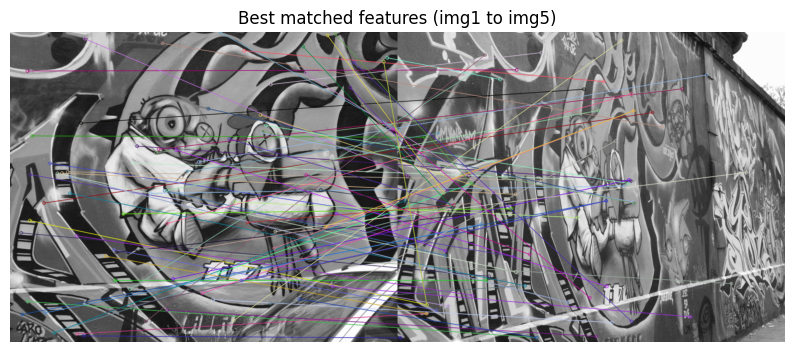

Using ground truth homography from graf/graf/H1to5p:
[[ 6.2544644e-01  5.7759174e-02  2.2201217e+02]
 [ 2.2240536e-01  1.1652147e+00 -2.5605611e+01]
 [ 4.9212545e-04 -3.6542424e-05  1.0000000e+00]]


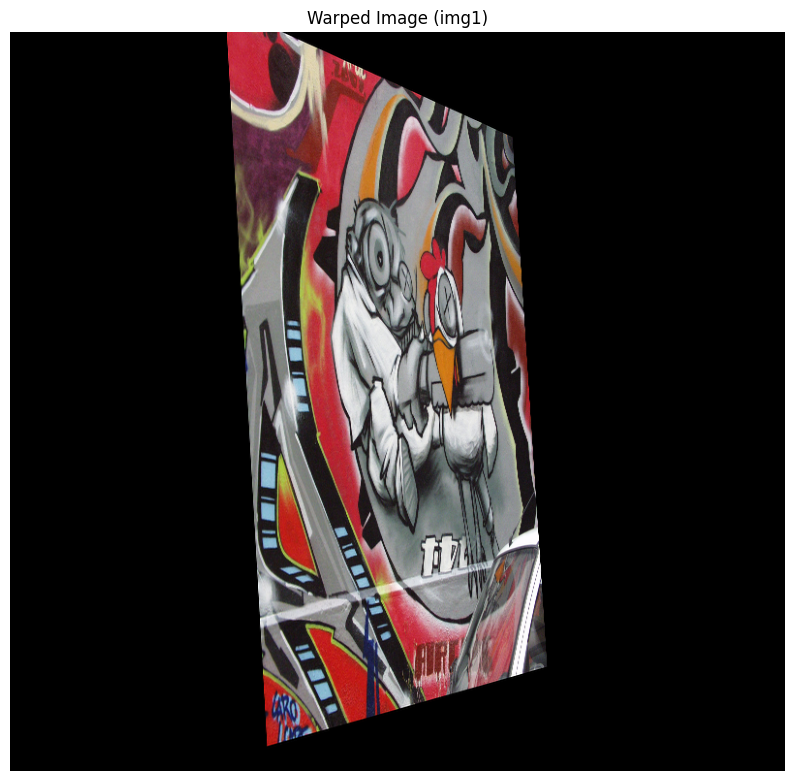

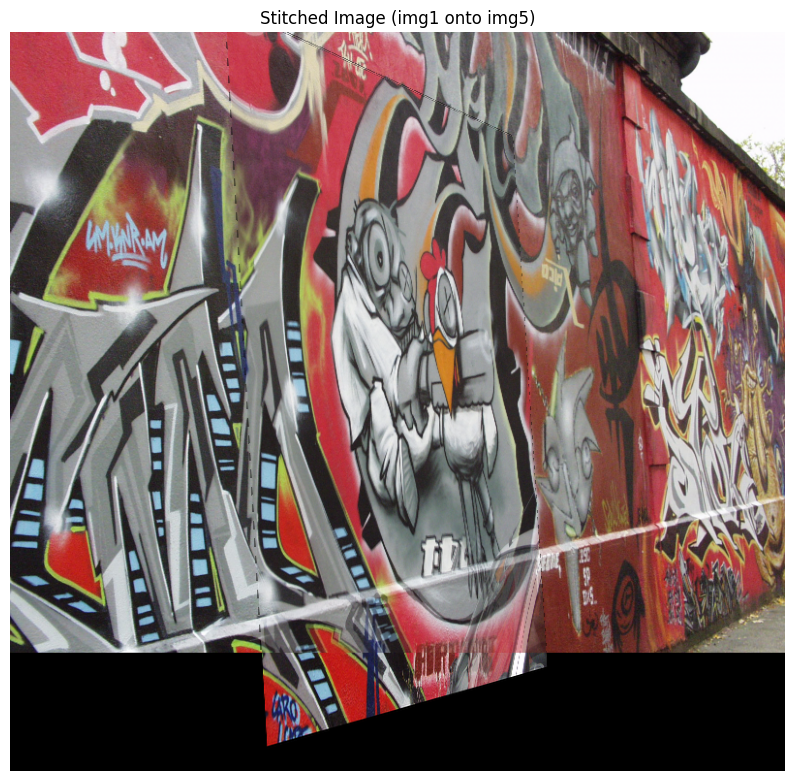

In [129]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import transform

# Set to True to stitch img3 onto img5, False for img1
USE_IMG3 = False  # Default to img3 since you have H3to5p

# Load images
img_ref = 'graf/graf/img3.ppm' if USE_IMG3 else 'graf/graf/img1.ppm'
img1 = cv2.imread(img_ref)
img5 = cv2.imread('graf/graf/img5.ppm')

# Check if images loaded
assert img1 is not None, f"Failed to load {img_ref}"
assert img5 is not None, "Failed to load img5.ppm"

# Convert to RGB for consistency
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

def get_sift_features(img1, img2):
    img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
    img2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
    sift = cv2.SIFT_create(nOctaveLayers=3, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6)
    keypoints1, descriptors1 = sift.detectAndCompute(img1_gray, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2_gray, None)
    if descriptors1 is None or descriptors2 is None:
        raise ValueError("No descriptors found in one or both images.")
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    best_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]
    return best_matches, keypoints1, keypoints2

def get_inliers(src_full, dst_full, tform, thres):
    dst_check = tform(src_full)
    errors = np.sqrt(np.sum((dst_check - dst_full) ** 2, axis=1))
    return np.where(errors < thres)[0]

def find_best_homography(good_matches, keypoints1, keypoints2):
    src_full = np.array([keypoints1[m.queryIdx].pt for m in good_matches], dtype=np.float32)
    dst_full = np.array([keypoints2[m.trainIdx].pt for m in good_matches], dtype=np.float32)
    if len(src_full) < 4:
        raise ValueError(f"Not enough matches ({len(src_full)} < 4) to compute homography.")
    num_points = 4
    thres = 1.0  # Reference code's strict threshold
    iters = 200  # Reference code's iteration count
    min_inliers = 4
    best_homography = None
    best_inlier_count = 0
    best_inliers = None
    np.random.seed(62)
    for i in range(iters):
        chosen_matches = np.random.choice(good_matches, num_points, replace=False)
        src_points = np.array([keypoints1[m.queryIdx].pt for m in chosen_matches], dtype=np.float32)
        dst_points = np.array([keypoints2[m.trainIdx].pt for m in chosen_matches], dtype=np.float32)
        try:
            tform = transform.estimate_transform('projective', src_points, dst_points)
            inliers = get_inliers(src_full, dst_full, tform, thres)
            if len(inliers) > best_inlier_count:
                best_inlier_count = len(inliers)
                best_homography = tform
                best_inliers = inliers
        except:
            continue
    if best_inlier_count >= min_inliers:
        src_inliers = src_full[best_inliers]
        dst_inliers = dst_full[best_inliers]
        best_homography = transform.estimate_transform('projective', src_inliers, dst_inliers)
        print(f"Custom RANSAC: Best no. of inliers = {best_inlier_count}")
    else:
        print("Custom RANSAC failed. Trying OpenCV's findHomography...")
        H, mask = cv2.findHomography(src_full, dst_full, cv2.RANSAC, ransacReprojThreshold=5.0)
        best_inlier_count = np.sum(mask) if mask is not None else 0
        if H is None or best_inlier_count < min_inliers:
            raise ValueError(f"RANSAC failed. Only {best_inlier_count} inliers found.")
        best_homography = transform.ProjectiveTransform(matrix=H)
        print(f"OpenCV RANSAC found {best_inlier_count} inliers.")
    return best_homography, best_inliers

# Get SIFT features and matches (for visualization and part (a)/(b))
good_matches, keypoints1, keypoints5 = get_sift_features(img1, img5)
print(f"Found {len(good_matches)} good matches.")

# Visualize matches
matched_img = cv2.drawMatches(cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY), keypoints1,
                              cv2.cvtColor(img5, cv2.COLOR_RGB2GRAY), keypoints5,
                              good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(10, 10))
plt.imshow(matched_img, cmap='gray')
plt.title(f"Best matched features ({'img3' if USE_IMG3 else 'img1'} to img5)")
plt.axis('off')
plt.show()

# Load ground truth homography
gt_h_file = 'graf/graf/H3to5p' if USE_IMG3 else 'graf/graf/H1to5p'
H_gt = np.loadtxt(gt_h_file).reshape(3, 3)
tform = transform.ProjectiveTransform(matrix=H_gt)
print(f"Using ground truth homography from {gt_h_file}:\n{H_gt}")

# Compute canvas size
h1, w1 = img1.shape[:2]
h5, w5 = img5.shape[:2]
corners = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
warped_corners = cv2.perspectiveTransform(corners, tform.params)
min_x, min_y = np.int32(warped_corners.min(axis=0).ravel() - 0.5)
max_x, max_y = np.int32(warped_corners.max(axis=0).ravel() + 0.5)
canvas_w = max(max_x, w5) - min(min_x, 0)
canvas_h = max(max_y, h5) - min(min_y, 0)
offset_x, offset_y = -min_x if min_x < 0 else 0, -min_y if min_y < 0 else 0

# Manual adjustment for alignment (optional, tune if needed)
manual_offset_y = -25  # Try -10 or -20 to shift down if ground truth still misaligns
offset_y += manual_offset_y

# Warp img1 to img5's coordinate system
H = tform.params.astype(np.float32)
warped_img1 = cv2.warpPerspective(img1, H, (canvas_w, canvas_h), flags=cv2.INTER_LANCZOS4, borderMode=cv2.BORDER_CONSTANT, borderValue=0)

# Visualize warped image separately
plt.figure(figsize=(10, 10))
plt.imshow(warped_img1)
plt.title(f"Warped Image ({'img3' if USE_IMG3 else 'img1'})")
plt.axis('off')
plt.show()

# Adjust img5 to the same canvas
translation = np.array([[1, 0, offset_x], [0, 1, offset_y], [0, 0, 1]], dtype=np.float32)
warped_img5 = cv2.warpPerspective(img5, translation, (canvas_w, canvas_h), flags=cv2.INTER_LANCZOS4, borderMode=cv2.BORDER_CONSTANT, borderValue=0)

# Simple alpha blending (reference code style)
mask_warped = cv2.cvtColor(warped_img1, cv2.COLOR_RGB2GRAY) > 0
mask_img5 = cv2.cvtColor(warped_img5, cv2.COLOR_RGB2GRAY) > 0
overlap = mask_warped & mask_img5

stitched = warped_img5.astype(np.float32)
stitched[mask_warped] = warped_img1[mask_warped].astype(np.float32)
stitched[overlap] = 0.5 * warped_img5[overlap].astype(np.float32) + 0.5 * warped_img1[overlap].astype(np.float32)

stitched = np.clip(stitched, 0, 255).astype(np.uint8)

# Save and visualize final stitched image
output_file = f"stitched_{'img3' if USE_IMG3 else 'img1'}_on_img5.ppm"
cv2.imwrite(output_file, cv2.cvtColor(stitched, cv2.COLOR_RGB2BGR))
plt.figure(figsize=(10, 10))
plt.imshow(stitched)
plt.title(f"Stitched Image ({'img3' if USE_IMG3 else 'img1'} onto img5)")
plt.axis('off')
plt.show()